# Project Overview

This project focuses on analyzing paired frontal and lateral X-ray images with an emphasis on the lungs. By isolating lung features and excluding irrelevant structures like bones and other organs, the model aims to reduce noise and improve the accuracy of predictions for lung-related conditions.

The framework addresses three key tasks:
	
1. **Image Reconstruction:** Reconstruct paired X-ray images to ensure the model learns meaningful features while acting as a regularization technique.
2. **Binary Classification:** Identify whether a patient is normal or abnormal based on lung features, aiding early detection of potential pathologies.
3. **Automated Report Generation:** Create interpretable reports summarizing findings, bridging the gap between model outputs and clinical workflows.

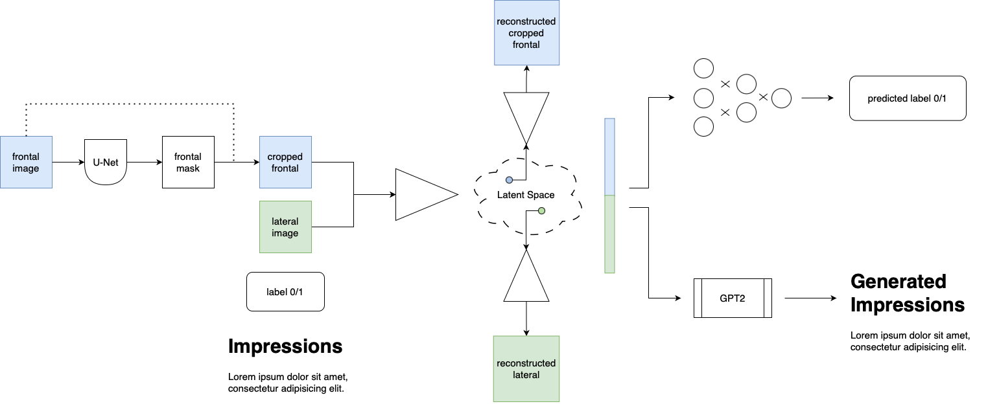

# Preprocessing
This project employed several preprocessing steps to prepare the dataset for modeling tasks, ensuring the focus remained on lung regions and improving model performance:

1.	**Data Cleaning:**
    * Patients with incomplete information or an incorrect number of images were excluded, retaining only those with exactly two images (one frontal and one lateral view).
	* Patients missing associated problems or impressions were removed to ensure dataset integrity.
2.	**Problem Categorization and Classification:**
	* Problems were filtered to focus on pulmonary conditions.
	* Patients were classified into two categories: **Normal** and **Abnormal**
3.	**Image Preprocessing:**
	* All images were resized to $224 \times 224$ pixels with 3 channels to meet the input requirements of the DenseNet121 architecture.
4.	**Lung Segmentation and Cropping:**
	* A pre-trained U-Net model was used for lung segmentation on frontal images.
	* Binary masks were generated to delineate lung regions.
	* The lung regions were cropped and resized to $224 \times 224$ pixels, ensuring consistency with the model’s input size.

### Load Initial Dataset

In [1]:
import os
import math
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split

DATA_DIR = "/kaggle/input/chest-xrays-indiana-university/"
IMG_SIZE = (224, 224)
BATCH_SIZE = 128

def categorize_tags(tags):
    """
    Categorize individual MeSH tags into broader subcategories.
    """
    categories = {
        "Lung Conditions": [
            "Pulmonary Atelectasis", "Airspace Disease", "Pulmonary Congestion", 
            "Pulmonary Edema", "Pulmonary Fibrosis", "Lung Diseases, Interstitial",
            "Emphysema", "Pulmonary Emphysema", "Bullous Emphysema",
            "Pneumonia", "Bronchitis", "Bronchiolitis", 
            "Granulomatous Disease", "Granuloma", "Lung, Hyperlucent", 
            "Volume Loss", "Cavitation", "Bronchiectasis", "Cystic Fibrosis"
        ],
        "Normal": ["normal"]
    }
    categorized_tags = {}
 
 
    for category, tag_list in categories.items():
        matched_tags = [tag for tag in tags if tag in tag_list]
        if matched_tags:
            categorized_tags[category] = matched_tags
 
    return categorized_tags

def load_and_preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    # img = tf.image.adjust_brightness(tf.image.adjust_contrast(img, contrast_factor=1.5), delta=-0.1)
    img = tf.image.resize(img, (224, 224))
    return tf.cast(img, tf.float32) / 255.0

def load_binary_dataset(data_dir, batch_size=32, test_size=0.15, val_size=0.15, shuffle=True):
    images_dir = os.path.join(data_dir, "images", "images_normalized")
    reports_csv = os.path.join(data_dir, "indiana_reports.csv")
    images_csv = os.path.join(data_dir, "indiana_projections.csv")
    
    # Load and merge DataFrames
    reports_df = pd.read_csv(reports_csv)
    images_df = pd.read_csv(images_csv)
    merged_df = pd.merge(images_df, reports_df, on="uid")
    
    # Process DataFrame once
    processed_data = []
    possible_categories = [
        "Lung Conditions",
        "Normal"
    ]
    tags_to_remove = ['Bullous Emphysema', 'Bronchiectasis', 
    'Cystic Fibrosis', 'Bronchitis', 'Cavitation', 'Bronchiolitis']
    
    category_counts = {cat: 0 for cat in possible_categories}
    for uid, group in merged_df.groupby("uid"):
        
        impression = group.iloc[0]["impression"]

        if not isinstance(impression, str) or impression.strip() == "":
            impression = "No impression available"
            continue
            
        frontal = group[group['projection'].str.lower() == 'frontal']
        lateral = group[group['projection'].str.lower() == 'lateral']
        problems = group.iloc[0]["Problems"]
        if lateral.empty or frontal.empty:
            continue

        frontal_path = os.path.join(images_dir, frontal.iloc[0]["filename"])
        lateral_path = os.path.join(images_dir, lateral.iloc[0]["filename"])
        
        if not os.path.exists(lateral_path) or not os.path.exists(frontal_path):
            continue
            
        tags = [tag.strip() for tag in problems.split(";")]
        categorized_tags = categorize_tags(tags)
        to_remove=False
        for tag in tags:
            if(tag in tags_to_remove):
                to_remove=True
        if(to_remove):
            continue
 
        if not categorized_tags:
            continue

        is_normal = "Normal" in categorized_tags   
    
        label = 0 if is_normal else 1
        
        processed_data.append((lateral_path, frontal_path, label, impression))
        for category in categorized_tags:
            category_counts[category] += 1
    
    # Split data into train, validation, and test sets
    train_data, test_val_data = train_test_split(processed_data, test_size=test_size + val_size, random_state=42)
    val_data, test_data = train_test_split(test_val_data, test_size=test_size / (test_size + val_size), random_state=42)
    
    # Create tf.data.Dataset for each split
    def create_dataset(data):
        lateral_paths, frontal_paths, labels, impressions = zip(*data)
    
        dataset = tf.data.Dataset.from_tensor_slices((
            {"frontal": list(frontal_paths), "lateral": list(lateral_paths)},
            list(labels), list(impressions)
        ))
        
        # Define preprocessing function
        def load_pair(paths, label, impression):
            return {
                "images": [load_and_preprocess_image(paths["frontal"]),
                           load_and_preprocess_image(paths["lateral"])],
                "labels": label,
                "impressions": impression
            }     
             
        length=len(list(data))
        dataset = dataset.shuffle(buffer_size=length)
        dataset = dataset.map(load_pair, num_parallel_calls=tf.data.AUTOTUNE)
        dataset = dataset.batch(batch_size)
        dataset = dataset.cache()
        dataset = dataset.prefetch(tf.data.AUTOTUNE)
        
        return dataset, length

    # Create the datasets
    train_dataset = create_dataset(train_data)
    val_dataset = create_dataset(val_data)
    test_dataset = create_dataset(test_data)
    
    # Create the datasets
    train_dataset, train_length = create_dataset(train_data)
    val_dataset, val_length = create_dataset(val_data)
    test_dataset, test_length = create_dataset(test_data)
    
    # Print statistics
    total = len(processed_data)
    normal = sum(1 for _, _, l, _ in processed_data if l == 0)
    print(f"\nDataset Statistics:")
    print(f"Total pairs: {total}")
    print(f"Normal cases: {normal} ({(normal/total)*100:.2f}%)")
    print(f"Abnormal cases: {total-normal} ({((total-normal)/total)*100:.2f}%)")

    train_length= math.ceil(train_length/BATCH_SIZE)
    val_length= math.ceil(val_length/BATCH_SIZE)
    test_length= math.ceil(test_length/BATCH_SIZE)
    
    print(f"  - Train set batches: {train_length}")
    print(f"  - Validation set batches: {val_length}")
    print(f"  - Test set batches: {test_length}")
    
    return train_dataset, val_dataset, test_dataset

print("Loading datasets...")

train_dataset, val_dataset, test_dataset = load_binary_dataset(DATA_DIR, batch_size=BATCH_SIZE)
train_dataset=train_dataset.shuffle(buffer_size=len(list(train_dataset)))

print("\nLoading completed!")

Loading datasets...

Dataset Statistics:
Total pairs: 1884
Normal cases: 1230 (65.29%)
Abnormal cases: 654 (34.71%)
  - Train set batches: 11
  - Validation set batches: 3
  - Test set batches: 3

Loading completed!


## Load Segmentation Model
To focus on lung regions in X-ray images, we utilized a pre-trained U-Net-based lung segmentation model. This model generates binary masks from grayscale input images, effectively isolating the lung areas. It ensures that subsequent analysis targets only the lungs, improving the precision of downstream tasks like disease classification. The segmentation model processes images of size $512 \times 512$, producing masks of the same dimensions.

[Lung Segmentation U-Net Model for Medical Imaging](https://www.kaggle.com/models/iamtapendu/lung-segmentation-model/TensorFlow2/2.0/1)

In [2]:
from tensorflow.keras.models import load_model
import numpy as np
import cv2

# Jaccard Index Metric
def jaccard_index(y_true, y_pred, smooth=100):
    """Calculates the Jaccard index (IoU), useful for evaluating the model's performance."""
    y_true_f = tf.reshape(tf.cast(y_true, tf.float32), [-1])  # Flatten and cast ground truth
    y_pred_f = tf.reshape(tf.cast(y_pred, tf.float32), [-1])  # Flatten and cast predictions
    intersection = tf.reduce_sum(y_true_f * y_pred_f)  # Compute intersection
    total = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection  # Total pixels
    return (intersection + smooth) / (total + smooth)


def dice_coefficient(y_true, y_pred, smooth=1):
    # Flatten and cast true and predicted masks to float32
    y_true_f = tf.reshape(tf.cast(y_true, tf.float32), [-1])  # Flatten and cast y_true to float32
    y_pred_f = tf.reshape(tf.cast(y_pred, tf.float32), [-1])  # Flatten and cast y_pred to float32

    # Calculate the intersection between the true and predicted masks
    intersection = tf.reduce_sum(y_true_f * y_pred_f)

    # Calculate the Dice coefficient using the formula
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

# Load the best model (assuming you've trained and saved it using ModelCheckpoint)
segmentation_model = load_model('/kaggle/input/lung-segmentation-model/tensorflow2/2.0/1/best_model.keras', custom_objects={'dice_coefficient': dice_coefficient, 'jaccard_index': jaccard_index})

## Segmentation Pipeline

### 1.	Segmentation Model Prediction
The `predict_masks` function processes a batch of images, resizing them to $512 \times 512$ for model input. It predicts binary segmentation masks, post-processes them by thresholding, and resizes them to $224 \times 224$ for further analysis.

In [6]:
import cv2
import numpy as np

def predict_masks(images):
    """
    Predict segmentation masks for a batch of images.

    Args:
        images: A batch of images (TensorFlow tensor or NumPy array) with shape (batch_size, height, width, channels).

    Returns:
        pred_masks: Predicted segmentation masks (numpy array) with shape (batch_size, 224, 224).
    """
    # Convert TensorFlow tensor to NumPy array if necessary
    if hasattr(images, "numpy"):
        images = images.numpy()

    # Ensure the input is a NumPy array
    if not isinstance(images, np.ndarray):
        raise ValueError("Input must be a NumPy array or TensorFlow tensor.")

    # Initialize a list to store the predicted masks
    pred_masks = []

    # Iterate over each image in the batch
    for img in images:
        # Ensure the image is not None and is a valid array
        if img is None or not isinstance(img, np.ndarray):
            raise ValueError("Invalid image in the batch.")

        # Convert RGB to grayscale if the model expects 1 channel
        if segmentation_model.input_shape[-1] == 1 and img.shape[-1] == 3:
            img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Resize the image to (512, 512)
        img_resized = cv2.resize(img, (512, 512))

        # Add channel dimension if the image is grayscale
        if len(img_resized.shape) == 2:
            img_resized = np.expand_dims(img_resized, axis=-1)

        # Add batch dimension
        img_input = np.expand_dims(img_resized, axis=0)

        # Predict the segmentation mask
        pred_mask = segmentation_model.predict(img_input)

        # Post-process the predicted mask
        pred_mask = np.squeeze(pred_mask)  # Remove batch dimension
        pred_mask = (pred_mask > 0.5).astype(np.uint8)  # Binarize the mask

        # Resize the mask back to 224x224
        pred_mask_resized = cv2.resize(pred_mask, (224, 224), interpolation=cv2.INTER_NEAREST)

        # Append the resized predicted mask to the list
        pred_masks.append(pred_mask_resized)

    # Convert the list of masks to a numpy array
    pred_masks = np.array(pred_masks)

    return pred_masks

### 2.	Mask Cleaning
To enhance mask quality, the `clean_segmentation_mask` function applies morphological operations to remove noise and fill gaps.

In [3]:
import cv2
import numpy as np

def clean_segmentation_mask(mask, kernel_size=5, min_object_size=100):
    """
    Clean up a binary segmentation mask using morphological operations and connected component analysis.
    
    Args:
        mask: Binary mask (numpy array)
        kernel_size: Size of the kernel for morphological operations (default: 5)
        min_object_size: Minimum size of objects to keep (default: 100)
    
    Returns:
        cleaned_mask: Cleaned binary mask
    """
    # Create kernels for morphological operations
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    
    # Fill holes in the mask
    mask_filled = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    
    # Remove small noise using morphological openingresized_imgresized_img
    mask_opened = cv2.morphologyEx(mask_filled, cv2.MORPH_OPEN, kernel)
    
    # Connected component analysis to remove small isolated regions
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask_opened, connectivity=8)
    
    # Create a new mask with only the large components
    cleaned_mask = np.zeros_like(mask)
    for i in range(1, num_labels):  # Skip label 0 (background)
        if stats[i, cv2.CC_STAT_AREA] >= min_object_size:
            cleaned_mask[labels == i] = 1
    
    # Smooth the edges
    cleaned_mask = cv2.medianBlur(cleaned_mask.astype(np.uint8), kernel_size)
    
    return cleaned_mask

def process_batch_masks(masks):
    """
    Process a batch of masks using the cleaning function.
    
    Args:
        masks: Batch of binary masks (numpy array)
    
    Returns:
        cleaned_masks: Batch of cleaned binary masks
    """
    cleaned_masks = []
    for mask in masks:
        cleaned_mask = clean_segmentation_mask(mask)
        cleaned_masks.append(cleaned_mask)
    return np.array(cleaned_masks)

### 3.	Image Cropping
The <code>crop_images_by_masks</code> function extracts lung regions from the original images using the cleaned masks.

In [4]:
import numpy as np
import cv2

def crop_images_by_masks(images, masks, min_size=50, padding=10):
    """
    Crops the images using the provided masks.
    Args:
        masks: Array of binary masks.
        images: Array of original images corresponding to the masks.
        min_size: Minimum size (in pixels) for the width and height of the bounding box.
                 If the bounding box is smaller, the original image is used.
        padding: Number of pixels to add around the bounding box.
    Returns:
        cropped_images: Array of cropped images.
        bounding_boxes: List of tuples containing the bounding boxes (x_min, y_min, w, h).
    """
    cropped_images = []
    bounding_boxes = []
    for i in range(len(masks)):
        mask = (masks[i] * 255).astype(np.uint8)
        # Find the edges of the mask using Canny
        edged = cv2.Canny(mask, 30, 200)
        # Find the contours in the mask
        contours, _ = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if not contours:
            # If no contours are found, use the original image
            print(f"No contours found for mask {i}. Using original image.")
            cropped_images.append(images[i].numpy())
            bounding_boxes.append((0, 0, images[i].shape[1], images[i].shape[0]))
            continue
            
        # Initialize the coordinates for the overall bounding box
        x_min, y_min, x_max, y_max = float('inf'), float('inf'), 0, 0
        # Find the overall bounding box that includes all contours
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            x_min = min(x_min, x)
            y_min = min(y_min, y)
            x_max = max(x_max, x + w)
            y_max = max(y_max, y + h)
        
        # Convert the coordinates to integers
        x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
        
        # Apply padding, ensuring we don't go out of the image boundaries
        x_min = max(x_min - padding, 0)
        y_min = max(y_min - padding, 0)
        x_max = min(x_max + padding, images[i].shape[1])
        y_max = min(y_max + padding, images[i].shape[0])
        
        # Calculate the width and height of the overall bounding box
        w = x_max - x_min
        h = y_max - y_min
        
        # Check if the dimensions are too small
        if w < min_size or h < min_size:
            print(f"Bounding box too small for mask {i} ({w}x{h} pixels). Using original image.")
            cropped_images.append(images[i].numpy())
            bounding_boxes.append((0, 0, images[i].shape[1], images[i].shape[0]))
            continue
            
        # Crop the original image using the overall bounding box
        image = (images[i].numpy() * 255).astype(np.uint8)
        cropped_image = image[y_min:y_max, x_min:x_max]
        cropped_images.append(cropped_image)
        bounding_boxes.append((x_min, y_min, w, h))
        
    return np.array(cropped_images, dtype=object), bounding_boxes

### Visualize Cropped Lungs

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


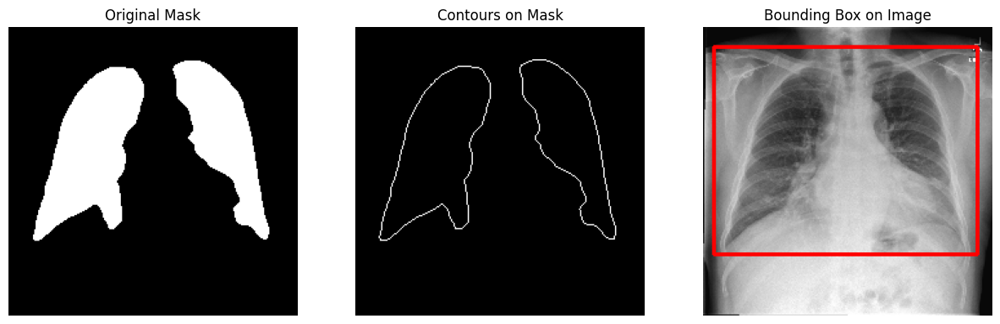

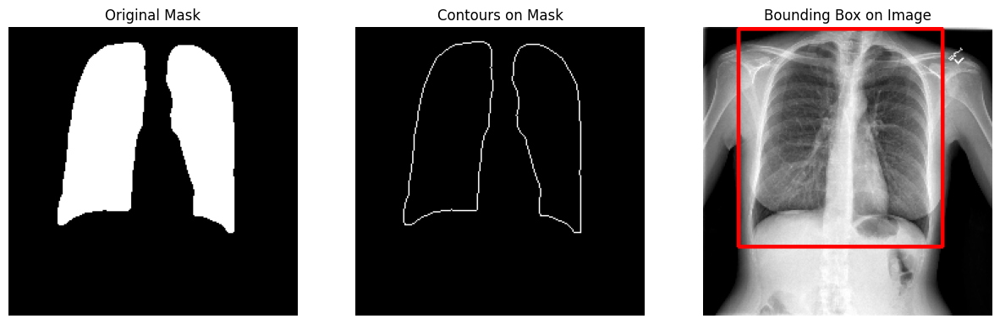

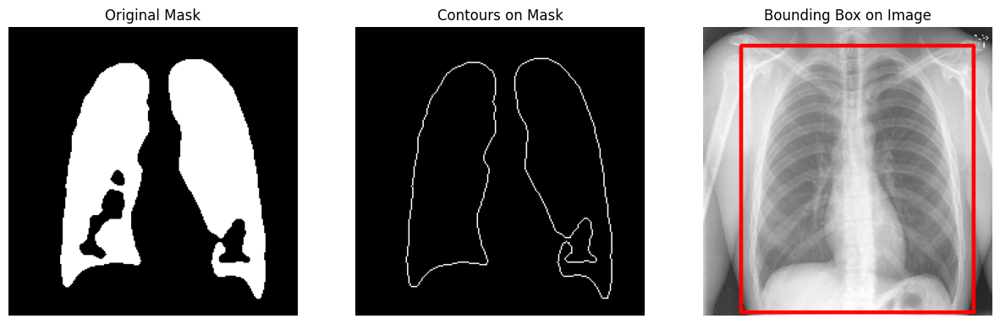

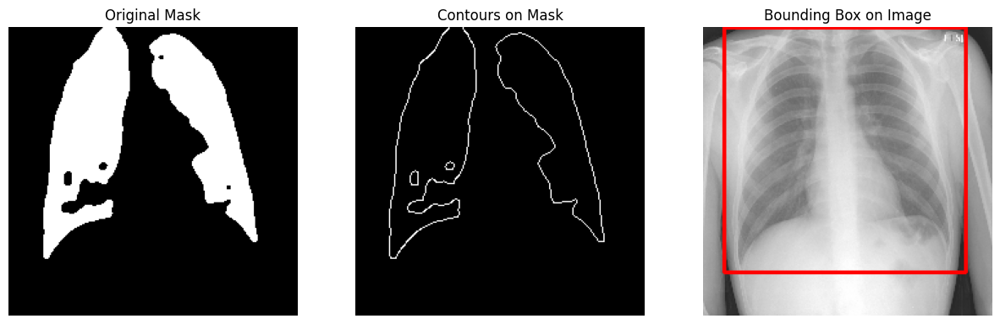

In [8]:
import matplotlib.pyplot as plt

def plot_cropping_results(masks, images, bounding_boxes):
    """
    Displays the original masks, contours, and bounding boxes.

    Args:
        masks: Array of binary masks.
        images: Array of original images corresponding to the masks.
        bounding_boxes: List of tuples containing the bounding boxes (x_min, y_min, w, h).
    """
    for i in range(len(masks)):
        mask = (masks[i] * 255).astype(np.uint8)

        # Find the edges of the mask using Canny
        edged = cv2.Canny(mask, 30, 200)

        # Find the contours in the mask
        contours, _ = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Create an empty image to draw the contours
        contour_image = np.zeros_like(mask)

        # Draw the contours on the image
        cv2.drawContours(contour_image, contours, -1, (255), 1)

        # Extract the bounding box
        x_min, y_min, w, h = bounding_boxes[i]

        # Create a copy of the image to draw the bounding box
        image = (images[i].numpy() * 255).astype(np.uint8)
        box_image = image.copy()

        # Draw the overall bounding box on the image
        cv2.rectangle(box_image, (x_min, y_min), (x_min + w, y_min + h), (255, 0, 0), 2)  # Color: blue, Thickness: 2

        # Display the image with the bounding box, mask, and contours
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(mask, cmap='gray')
        plt.title("Original Mask")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(contour_image, cmap='gray')
        plt.title("Contours on Mask")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(box_image, cmap='gray')
        plt.title("Bounding Box on Image")
        plt.axis("off")

        plt.show()

for batch in train_dataset.take(1):
    images = batch["images"]

    frontal_images = images[:,0]
    frontal_masks = predict_masks(frontal_images)
    cleaned_frontal_masks = process_batch_masks(frontal_masks)
    
    cropped_images, bounding_boxes = crop_images_by_masks(frontal_images, cleaned_frontal_masks)
    plot_cropping_results(cleaned_frontal_masks, frontal_images, bounding_boxes)

### Create Cropped Dataset
The creation of the cropped datasets is achieved through a mapping process applied to each dataset (training, validation, and testing). This involves iterating over the dataset batches and applying a sequence of transformations to the images

In [ ]:
def create_cropped_datasets(train_dataset, val_dataset, test_dataset, predict_masks, process_batch_masks, crop_images_by_masks):
    def crop_and_replace(dataset):
        cropped_data = []

        for batch in dataset:
            images = batch["images"]
            labels = batch["labels"]
            impressions = batch["impressions"]

            frontal_images = images[:, 0]
            lateral_images = images[:, 1]

            # Predict masks for frontal images
            frontal_masks = predict_masks(frontal_images)
            cleaned_frontal_masks = process_batch_masks(frontal_masks)

            # Crop frontal images
            cropped_images, _ = crop_images_by_masks(frontal_images, cleaned_frontal_masks)

            # Resize cropped images to 224x224 and normalize
            resized_cropped_images = []
            for img in cropped_images:
                resized_img = tf.image.resize(tf.convert_to_tensor(img, dtype=tf.float32), size=(224, 224))
                normalized_img = resized_img / 255.0
                resized_cropped_images.append(normalized_img)
            resized_cropped_images = tf.stack(resized_cropped_images)

            # Combine lateral and resized cropped frontal images
            combined_images = tf.stack([resized_cropped_images, lateral_images], axis=1)

            # Append to new dataset
            for img_pair, label, impression in zip(combined_images, labels, impressions):
                cropped_data.append((img_pair, label, impression))

        # Convert to tf.data.Dataset
        images, labels, impressions = zip(*cropped_data)
        new_dataset = tf.data.Dataset.from_tensor_slices(
            {
                "images": list(images),
                "labels": list(labels),
                "impressions": list(impressions)
            }
        )
        return new_dataset.batch(BATCH_SIZE).shuffle(buffer_size=1000).prefetch(tf.data.AUTOTUNE)

    # Create new datasets
    cropped_train_dataset = crop_and_replace(train_dataset)
    cropped_val_dataset = crop_and_replace(val_dataset)
    cropped_test_dataset = crop_and_replace(test_dataset)

    return cropped_train_dataset, cropped_val_dataset, cropped_test_dataset

train_dataset, val_dataset, test_dataset = create_cropped_datasets(
    train_dataset,
    val_dataset,
    test_dataset,
    predict_masks,
    process_batch_masks,
    crop_images_by_masks
)

print("Cropped datasets created successfully!")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

### Visualize Cropped Dataset

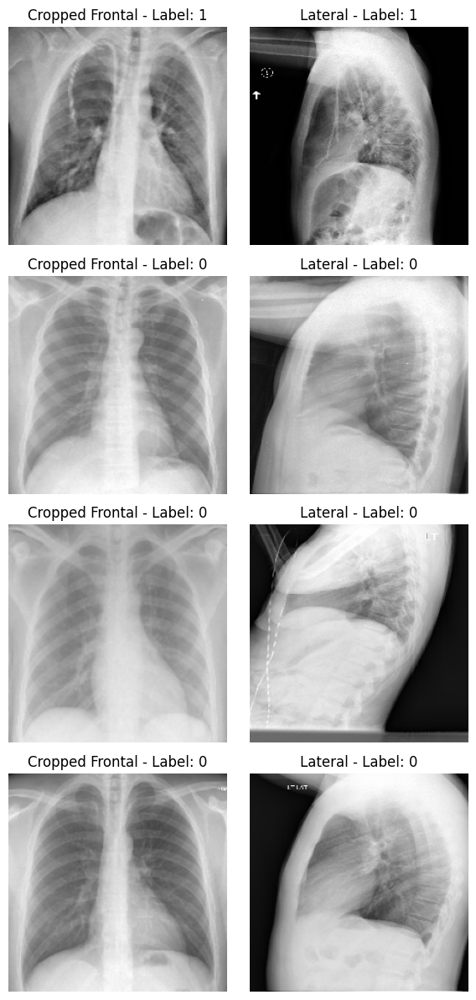

In [38]:
import matplotlib.pyplot as plt
import numpy as np

# Take one batch from the cropped train dataset
for batch in train_dataset.take(1):
    images = batch["images"]
    labels = batch["labels"]
    
    # Extract lateral and cropped frontal images
    cropped_frontal_images = images[:, 0]  
    lateral_images = images[:, 1]  
    labels = labels.numpy()
    
    # Number of images to display
    num_images = min(4, lateral_images.shape[0])
    
    # Create a figure with subplots
    fig, axes = plt.subplots(nrows=num_images, ncols=2, figsize=(6, 3*num_images))
    
    # Flatten axes for easy iteration
    axes = axes.flatten() if num_images > 1 else [axes[0], axes[1]]
    
    for i in range(num_images):
        # Cropped frontal image
        axes[2*i].imshow(cropped_frontal_images[i])
        axes[2*i].set_title(f"Cropped Frontal - Label: {labels[i]}")
        axes[2*i].axis('off')

        # Lateral image
        axes[2*i + 1].imshow(lateral_images[i])
        axes[2*i + 1].set_title(f"Lateral - Label: {labels[i]}")
        axes[2*i + 1].axis('off')
        
    plt.tight_layout(pad=1.0)
    plt.show()

## Visualize Callback
This callback is designed to provide a visual and textual evaluation of the model’s performance at the end of each training epoch. It monitors the model’s progress on three key tasks: image reconstruction, binary label prediction, and text generation. By using a batch of validation data, it displays the original and reconstructed images for both frontal and lateral views, predicts binary labels to compare with the true labels, and generates text based on the model’s outputs. The generated and original texts are cleaned and displayed for easy comparison.

In [9]:
from tensorflow import keras
import matplotlib.pyplot as plt
import re

def clean_text(text):
    """
    Clean text by removing <|endoftext|> and truncating after meaningful content.
    Also removes trailing repetitive characters like '!'.
    """
    if isinstance(text, list):  # If it's a list, apply the function to each element
        return [clean_text(item) for item in text]
    
    # Remove <|endoftext|>
    text = text.replace('<|endoftext|>', '')
    
    # Remove trailing repetitive characters (e.g., '!!!!!!!!!!!!!!!!!!!!')
    text = re.sub(r'(!+|\?+|\.+|\s+)$', '', text)
    
    # Truncate after the last meaningful sentence (e.g., after a period, exclamation mark, or question mark)
    last_meaningful_index = max(
        text.rfind('.'),  # Last period
        text.rfind('!'),  # Last exclamation mark
        text.rfind('?'),  # Last question mark
    )
    
    # If no meaningful sentence-ending character is found, keep the entire text
    if last_meaningful_index == -1:
        return text.strip()  # Remove leading/trailing whitespace
    
    # Truncate the text after the last meaningful sentence
    return text[:last_meaningful_index + 1].strip()

class VisualizeCallback(keras.callbacks.Callback):
    def __init__(self, validation_data, num_images=4):
        self.validation_data = validation_data
        self.num_images = num_images
    
    
    def truncate_at_endoftext(self, text):
        if isinstance(text, list):  # If it's a list, apply the function to each element
            return [self.truncate_at_endoftext(item) for item in text]
        endoftext_index = text.find('<|endoftext|>')
        if endoftext_index != -1:
            return text[:endoftext_index]
        return text

    def on_epoch_end(self, epoch, logs=None):
        # Get a batch of validation data
        batch = next(iter(self.validation_data))
        self.num_images=batch["images"].shape[0]
        x_val = batch["images"][:self.num_images, 0, :, :, :]  # Frontal images
        y_val = batch["images"][:self.num_images, 1, :, :, :]  # Lateral images
        z_val = batch["labels"][:self.num_images]  # Labels
        input_images=batch["images"][:self.num_images]
        
        # Get model predictions
        reconstructed = self.model.predict(batch)
        classification=reconstructed["classification"]

        tokenizer = gpt2_model.preprocessor.tokenizer  # Access the tokenizer
        generated=[]
        
        for i in range(self.num_images):
            # Extract single example
            single_input_images = {
                "images": input_images[i][tf.newaxis, ...],  # Add batch dimension
                "impressions": [batch["impressions"][0]]
            }
            if(classification[i]>=0.5):
                outputs = model.generate_text(single_input_images, max_length=50, temperature=0.2, top_k=20)
            else:
                outputs = model.generate_text(single_input_images, max_length=50, temperature=1.0, top_k=20)
            generated_tokens = outputs["generated_text"]
            generated_text = tokenizer.detokenize(generated_tokens)  # List of strings
            generated.append(generated_text)

        original = batch["impressions"][0]['token_ids']
        original_text = tokenizer.detokenize(original)
        
        # Clean generated and original text
        cleaned_generated_text = self.truncate_at_endoftext(generated)
        cleaned_original_text = clean_text(original_text)
        
        # Plot the results
        fig, axes = plt.subplots(4, self.num_images, figsize=(20, 10))
        for i in range(self.num_images):
            # Display frontal image
            axes[0, i].imshow(x_val[i])
            axes[0, i].axis("off")
            axes[0, i].set_title(f'Label True: {z_val[i].numpy()}\n')
            
            # Display reconstructed frontal image
            axes[1, i].imshow(reconstructed["reconstructed_frontal"][i])
            axes[1, i].axis("off")
            
            # Display lateral image
            axes[2, i].set_title(f'Label Pred: {reconstructed["classification"][i]}\n')
            axes[2, i].imshow(y_val[i])
            axes[2, i].axis("off")
            
            # Display reconstructed lateral image
            axes[3, i].imshow(reconstructed["reconstructed_lateral"][i])
            axes[3, i].axis("off")
            
            # Print cleaned generated and original text
            print(f"Predicted: {cleaned_generated_text[i][0]}")
            print(f"Original: {cleaned_original_text[i]}")
            print("\n" + "=" * 50 + "\n")

        
        plt.tight_layout()
        plt.show()

## Import GPT-2 from <code>KerasHub</code>

In [9]:
import keras
import keras_hub
import numpy as np

# Load GPT-2 model from keras_hub
gpt2_model = keras_hub.models.GPT2CausalLM.from_preset("gpt2_base_en")

In [10]:
backbone = gpt2_model.get_layer("gpt2_backbone")

# Fully trainable
for i, layer in enumerate(backbone.layers):
    layer.trainable = True

In [11]:
for layer in gpt2_model.layers:
    print(f"Layer: {layer.name}, Trainable: {layer.trainable}")

Layer: padding_mask, Trainable: True
Layer: token_ids, Trainable: True
Layer: gpt2_backbone, Trainable: True
Layer: token_embedding, Trainable: True


### Custom GPT-2 with <code>inputs_embeds</code>
This custom GPT-2 model was created because the original GPT-2 model from Keras Hub only accepts token IDs (text) as input, while the task at hand requires working with input embeddings (latent space).

To address this limitation, the custom GPT-2 model modifies the original architecture by adding a method to process input embeddings directly. This allows the model to accept precomputed embeddings as input, while still maintaining the structure and functionality of the original GPT-2 model. The custom model also includes mechanisms to combine the input embeddings with the latent space, enabling more flexibility and control over the model’s input processing.

In [12]:
class CustomGPT2(tf.keras.Model):
    def __init__(self, gpt2_model):
        super(CustomGPT2, self).__init__()

        self.gpt2_embedding = gpt2_model.get_layer("gpt2_backbone")

        backbone=gpt2_model.get_layer("gpt2_backbone")
        self.token_embed = backbone.get_layer("token_embedding")
        self.position_embed = backbone.get_layer("position_embedding")
        self.embed_add = backbone.get_layer("embeddings_add")
        self.dropout = backbone.get_layer("embeddings_dropout")
        
        self.gpt2_backbone = gpt2_model.get_layer("gpt2_backbone").layers[6:-1]  # Exclude last layer norm
        self.final_layer_norm = gpt2_model.get_layer("gpt2_backbone").layers[-1]
        
        # Access the token embedding layer
        self.token_embedding = gpt2_model.get_layer("token_embedding")

    def token_embeddings(self, input_ids, training=True):
        """Generate embeddings from input tokens with proper layer addition."""
        # Generate token embeddings
        token_embeds = self.token_embed(input_ids)
        # Generate position embeddings
        position_embeds = self.position_embed(token_embeds, training=training)
        # Add the embeddings
        combined = self.embed_add([token_embeds, position_embeds], training=training)
        
        dropout = self.dropout(combined, training=training)
        return dropout
        
    def call(self, inputs, latent_embeds, training=False):
        """
        Forward pass for the custom GPT-2 model.

        Args:
            inputs: Dictionary containing:
                - inputs_embeds: Embeddings of shape (batch_size, seq_len, 768).
                - attention_mask: Attention mask of shape (batch_size, seq_len).
            training: Whether the model is in training mode.

        Returns:
            logits: Output logits of shape (batch_size, seq_len, vocab_size).
        """
        
        inputs_embeds = inputs["inputs_embeds"]
        attention_mask = inputs["attention_mask"]

        # Pass through the trimmed GPT-2 backbone
        hidden_states = inputs_embeds
        
        for layer in self.gpt2_backbone:
            if isinstance(layer, tf.keras.layers.Layer):  # Skip any non-layer elements
                # Process current hidden states
                hidden_states = layer(
                    decoder_sequence=hidden_states,
                    decoder_padding_mask=attention_mask,
                    use_causal_mask=True,
                    training=training
                )
                
                # Concatenate latent space with hidden states
                # Broadcast latent embedding to match sequence length
                seq_length = tf.shape(hidden_states)[1]
                broadcasted_latent = tf.repeat(latent_embeds, seq_length, axis=1)
                
                # Combine through element-wise addition
                hidden_states = hidden_states + 0.1 * broadcasted_latent 

        hidden_states = self.final_layer_norm(hidden_states)

        # Get logits from the token embedding layer (reversible embedding)
        logits = self.token_embedding(hidden_states, reverse=True)

        return logits

In [13]:
# Initialize the custom GPT-2 model
custom_gpt2_model = CustomGPT2(gpt2_model)

backbone = custom_gpt2_model.get_layer("gpt2_backbone")
for i, layer in enumerate(backbone.layers):
    print(f"Layer {i} ({layer.name}) trainable: {layer.trainable}")
    
layer=custom_gpt2_model.get_layer("gpt2_backbone")
layer.summary()

Layer 0 (token_ids) trainable: True
Layer 1 (token_embedding) trainable: True
Layer 2 (position_embedding) trainable: True
Layer 3 (embeddings_add) trainable: True
Layer 4 (embeddings_dropout) trainable: True
Layer 5 (padding_mask) trainable: True
Layer 6 (transformer_layer_0) trainable: True
Layer 7 (transformer_layer_1) trainable: True
Layer 8 (transformer_layer_2) trainable: True
Layer 9 (transformer_layer_3) trainable: True
Layer 10 (transformer_layer_4) trainable: True
Layer 11 (transformer_layer_5) trainable: True
Layer 12 (transformer_layer_6) trainable: True
Layer 13 (transformer_layer_7) trainable: True
Layer 14 (transformer_layer_8) trainable: True
Layer 15 (transformer_layer_9) trainable: True
Layer 16 (transformer_layer_10) trainable: True
Layer 17 (transformer_layer_11) trainable: True
Layer 18 (layer_norm) trainable: True


Model: "gpt2_backbone"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ token_ids (InputLayer)    │ (None, None)           │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ token_embedding           │ (None, None, 50257)    │     38,597,376 │ token_ids[0][0]        │
│ (ReversibleEmbedding)     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ position_embedding        │ (None, None, 768)      │        786,432 │ token_embedding[0][0]  │
│ (PositionEmbedding)       │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embeddings_add (Add)      │ (None, None, 768)      │              0 │ token_embedding[0][0], │
│                           │                        │                │ position_embedding[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embeddings_dropout        │ (None, None, 768)      │              0 │ embeddings_add[0][0]   │
│ (Dropout)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ padding_mask (InputLayer) │ (None, None)           │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_0       │ (None, None, 768)      │      7,087,872 │ embeddings_dropout[0]… │
│ (TransformerDecoder)      │                        │                │ padding_mask[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_1       │ (None, None, 768)      │      7,087,872 │ transformer_layer_0[0… │
│ (TransformerDecoder)      │                        │                │ padding_mask[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_2       │ (None, None, 768)      │      7,087,872 │ transformer_layer_1[0… │
│ (TransformerDecoder)      │                        │                │ padding_mask[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_3       │ (None, None, 768)      │      7,087,872 │ transformer_layer_2[0… │
│ (TransformerDecoder)      │                        │                │ padding_mask[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_4       │ (None, None, 768)      │      7,087,872 │ transformer_layer_3[0… │
│ (TransformerDecoder)      │                        │                │ padding_mask[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_5       │ (None, None, 768)      │      7,087,872 │ transformer_layer_4[0… │
│ (TransformerDecoder)      │                        │                │ padding_mask[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_6       │ (None, None, 768)      │      7,087,872 │ transformer_layer_5[0… │
│ (TransformerDecoder)      │                        │                │ padding_mask[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ transformer_layer_7       │ (None, None, 768)      │      7,087,872 │ transformer_layer_6[0… │
│ (TransformerDecoder) 

 Total params: 124,439,808 (474.70 MB)

 Trainable params: 124,439,808 (474.70 MB)

 Non-trainable params: 0 (0.00 B)

### Tokenize Impressions

In [14]:
# Tokenize the impressions using GPT-2's tokenizer
def tokenize_impressions(data):
    # Tokenize the impressions (strings) into token IDs
    tokenized_impressions = gpt2_model.preprocessor(data['impressions'])
    return {
        'images': data['images'],
        'labels': data['labels'],
        'impressions': tokenized_impressions
    }

# Apply tokenization to the dataset
train_dataset = train_dataset.map(tokenize_impressions)
val_dataset = val_dataset.map(tokenize_impressions)

In [15]:
train_dataset

<_MapDataset element_spec={'images': TensorSpec(shape=(None, 2, 224, 224, 3), dtype=tf.float32, name=None), 'labels': TensorSpec(shape=(None,), dtype=tf.int32, name=None), 'impressions': ({'token_ids': TensorSpec(shape=(None, 1024), dtype=tf.int32, name=None), 'padding_mask': TensorSpec(shape=(None, 1024), dtype=tf.bool, name=None)}, TensorSpec(shape=(None, 1024), dtype=tf.int32, name=None), TensorSpec(shape=(None, 1024), dtype=tf.bool, name=None))}>

# Model Architecture

## Encoder - Decoder
The encoder is essentially a DenseNet121 model pre-trained on the CheXNet dataset, with the weights loaded from a pre-trained CheXNet model. The last 5 layers of the DenseNet121 model are unfrozen to allow fine-tuning, while the rest of the layers are frozen to retain the learned features from the pre-trained model. To enhance image reconstruction, skip connections are added from intermediate layers of the DenseNet121 model, which are used in the decoder to help restore finer details during the upsampling process.

In [15]:
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.applications import DenseNet121
from tensorflow import keras
import numpy as np
from tensorflow.keras import layers, Model, regularizers

def create_encoder(input_shape, latent_dim=2048):
    """Create encoder using pre-trained DenseNet121."""
    # Load pre-trained DenseNet121
    chexNet = keras.applications.DenseNet121(include_top=False, weights=None, 
                                         input_shape=(224, 224, 3), pooling="avg")

    X = chexNet.output
    X = Dense(14, activation="sigmoid", name="predictions")(X)
    model = Model(inputs=chexNet.input, outputs=X)

    # Load weights
    model.load_weights('/kaggle/input/chexnet-weights/brucechou1983_CheXNet_Keras_0.3.0_weights.h5')

    # Extract feature extraction parts
    base_model = Model(inputs=model.input, outputs=model.layers[-2].output)
    # Freeze DenseNet layers
    for layer in base_model.layers:
        layer.trainable = False

    n = 10
    for layer in base_model.layers[-n:]:
        layer.trainable = True
    
    # Get skip connections from specific layers
    skip1 = base_model.get_layer('conv1_relu').output 
    skip2 = base_model.get_layer('conv2_block6_concat').output 
    skip3 = base_model.get_layer('conv3_block12_concat').output
    skip4 = base_model.get_layer('conv4_block24_concat').output 
    skip5 = base_model.get_layer('conv5_block16_concat').output 
    x = base_model.get_layer('avg_pool').output
    
    # Create encoder model
    encoder = Model(
        inputs=base_model.input,
        outputs=[x, skip1, skip2, skip3, skip4, skip5],
        name="encoder"
    )
        
    return encoder
    
def create_decoder(latent_dim, output_shape, name_suffix=""):
    """Create decoder with skip connections from DenseNet."""
    # Input layers
    decoder_input = layers.Input(shape=(latent_dim,), name=f"decoder_input_{name_suffix}")
    skip1 = layers.Input(shape=(112, 112, 64), name=f"skip1_{name_suffix}")    
    skip2 = layers.Input(shape=(56, 56, 256), name=f"skip2_{name_suffix}")     
    skip3 = layers.Input(shape=(28, 28, 512), name=f"skip3_{name_suffix}")     
    skip4 = layers.Input(shape=(14, 14, 1024), name=f"skip4_{name_suffix}")     
    skip5 = layers.Input(shape=(7, 7, 1024), name=f"skip5_{name_suffix}")     
    
    # Initial dense and reshape
    x = layers.Dense(7 * 7 * 1024, activation="relu")(decoder_input)
    x = layers.Reshape((7, 7, 1024))(x)
    x = layers.Concatenate()([x, skip5]) 
    
    # Upsampling blocks with skip connections
    # Block 1: 7x7 -> 14x14
    x = layers.Conv2DTranspose(1024, (3, 3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(1024, (3, 3), padding='same', activation='relu')(x)
    x = layers.Concatenate()([x, skip4])
    
    # Block 2: 14x14 -> 28x28
    x = layers.Conv2DTranspose(512, (3, 3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(512, (3, 3), padding='same', activation='relu')(x)
    x = layers.Concatenate()([x, skip3])
    
    # Block 3: 28x28 -> 56x56
    x = layers.Conv2DTranspose(256, (3, 3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = layers.Concatenate()([x, skip2])
    
    # Block 4: 56x56 -> 112x112
    x = layers.Conv2DTranspose(64, (3, 3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = layers.Concatenate()([x, skip1])
    
    # Final Block: 112x112 -> 224x224
    x = layers.Conv2DTranspose(32, (3, 3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(x)
    
    # Output layer
    decoder_output = layers.Conv2D(3, (3, 3), padding='same', activation='sigmoid',
                                   name=f"decoder_output_{name_suffix}")(x)
    
    decoder = Model([decoder_input, skip1, skip2, skip3, skip4, skip5],
                    decoder_output, name=f"decoder_{name_suffix}")
    return decoder

## Binary Classifier

In [16]:
from tensorflow.keras import layers, Model

def create_classifier(latent_dim=2048):
    classifier_input = layers.Input(shape=(latent_dim,))

    x = layers.Dense(512)(classifier_input)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(256)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Dropout(0.2)(x)
    
    # Output layer
    classifier_output = layers.Dense(1, activation='sigmoid')(x)

    classifier = Model(classifier_input, classifier_output, name="classifier")
    return classifier

## Architecture Components

### 1. Dual-Stream Image Processing
- **Input**: Accepts paired images (frontal and lateral views)
- **Encoder**: 
  - Shared encoder architecture based on DenseNet
  - Processes both frontal and lateral views independently
  - Produces latent representations and skip connections for each view
  - Output shape: <code>(batch_size, latent_dim=1024)</code>

### 2. Image Reconstruction Pathway
- **Dual Decoders**:
  - Separate decoders for frontal and lateral views
  - Utilizes skip connections from encoder for better detail preservation
  - Reconstructs original images at (224, 224, 3) resolution
- **Loss Function**: Combines Binary Cross-Entropy and Mean Squared Error
  - BCE for pixel-wise reconstruction accuracy
  - MSE for structural similarity
  - Equal weighting (0.5) for both losses

### 3. Classification Pathway
- **Classifier**:
  - Takes concatenated latent representations from both views
  - Performs binary classification
  - Uses sigmoid activation for final prediction
- **Metrics**: 
  - Binary Accuracy
  - Precision
  - Recall

### 4. Text Generation Pathway
- **Latent Space to Text**:
  - Dense layer maps combined latent space (2048D) to GPT-2 embedding space (768D)
  - Custom GPT-2 integration for conditioned text generation
- **Generation Features**:
  - Temperature-controlled sampling
  - Top-k and top-p sampling support
  - Maximum sequence length control
  - Dynamic attention mask handling

## Training Process

### Loss Components
1. **Reconstruction Loss**: 
   - Separate losses for frontal and lateral views
   - Combined with equal weighting (0.5 each)

2. **Classification Loss**:
   - Binary Cross-Entropy
   - Weighted by classification_weight parameter

3. **Text Generation Loss**:
   - Sparse Categorical Cross-Entropy
   - Masked to handle padding tokens
   - Applied only to non-padded sequence positions

### Training Features
- **Gradient Management**: Single backward pass for all components
- **Metric Tracking**: Individual trackers for each loss component
- **Flexibility**: Adjustable loss weightings through classification_weight parameter
- **Optimization**: Adam optimizer with configurable learning rate (default: 1e-4)

## Inference Capabilities

The model supports three main inference modes:

1. **Image Reconstruction**:
   - Reconstructs both frontal and lateral views
   - Preserves fine details through skip connections

2. **Classification**:
   - Binary classification output
   - Probability scores through sigmoid activation

3. **Text Generation**:
   - Conditioned on image features
   - Configurable generation parameters:
     - Temperature for sampling diversity
     - Top-k filtering
     - Maximum sequence length
     - Early stopping on end token

## Key Features

1. **Multi-Task Learning**:
   - Joint optimization of reconstruction, classification, and text generation
   - Shared latent space between vision and language tasks

2. **Skip Connections**:
   - Five-level skip connection architecture
   - Enables high-quality image reconstruction
   - Preserves fine-grained image details

3. **Flexible Loss Weighting**:
   - Adjustable balance between tasks
   - Separate tracking of component losses
   - Classification weight parameter for task importance

4. **Comprehensive Metrics**:
   - Individual loss tracking for each component
   - Classification performance metrics
   - Total loss monitoring

In [17]:
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras

import keras_nlp

class MultiInputOutput(keras.Model):
    def __init__(self, encoder, decoder_frontal, decoder_lateral, classifier, gpt2_model, classification_weight, beta=0.01, **kwargs):
        super(MultiInputOutput, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder_frontal = decoder_frontal
        self.decoder_lateral = decoder_lateral
        self.classifier = classifier
        
        self.gpt2_model = gpt2_model

        self.beta = beta
        self.image_size = encoder.input_shape[1] * encoder.input_shape[2] * encoder.input_shape[3]
        
        # Define a dense layer to map latent space to GPT-2 embedding size
        self.latent_to_embedding = keras.layers.Dense(768, activation='tanh')
        
        # Separate trackers for losses
        self.frontal_loss_tracker = keras.metrics.Mean(name='frontal_loss')
        self.lateral_loss_tracker = keras.metrics.Mean(name='lateral_loss')
        self.classification_loss_tracker = keras.metrics.Mean(name='classification_loss')
        self.text_generation_loss_tracker = keras.metrics.Mean(name='text_generation_loss')
        self.total_loss_tracker = keras.metrics.Mean(name='total_loss')
        
        self.classification_weight = classification_weight
        # Classification metrics
        self.accuracy = keras.metrics.BinaryAccuracy(name='accuracy')
        self.precision = keras.metrics.Precision(name='precision')
        self.recall = keras.metrics.Recall(name='recall')
        
        # Text generation metrics (if needed)
        # self.text_accuracy = keras.metrics.Accuracy(name='text_accuracy')

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.frontal_loss_tracker,
            self.lateral_loss_tracker,
            self.classification_loss_tracker,
            self.text_generation_loss_tracker,
            self.accuracy,
            self.precision,
            self.recall
        ]
    
    def _compute_reconstruction_loss(self, true, pred):
        # Combine BCE and MSE losses
        bce_loss = tf.reduce_mean(
            keras.losses.binary_crossentropy(
                tf.reshape(true, [-1, self.image_size]),
                tf.reshape(pred, [-1, self.image_size])
            )
        )
        
        mse_loss = tf.reduce_mean(
            tf.reduce_sum(
                tf.square(true - pred),
                axis=[1, 2, 3]
            )
        ) / self.image_size
        
        return 0.5 * bce_loss + 0.5 * mse_loss
    
    
    def train_step(self, data):
        if isinstance(data, dict):
            x = data['images']
            y = data['labels']
            tokenized_impressions = data['impressions']
        else:
            raise ValueError("Data should include images, labels, and impressions")
            
        frontal_images = x[:, 0, :, :, :]
        lateral_images = x[:, 1, :, :, :]
        
        with tf.GradientTape() as tape:
            # Encode both views
            z_frontal, skip1_frontal, skip2_frontal, skip3_frontal, skip4_frontal, skip5_frontal = self.encoder(frontal_images)
            z_lateral, skip1_lateral, skip2_lateral, skip3_lateral, skip4_lateral, skip5_lateral = self.encoder(lateral_images)
            
            # Classification
            z_class = tf.concat([z_frontal, z_lateral], axis=-1)
            classification_pred = self.classifier(z_class)
            
            # Decode both views
            reconstructed_frontal = self.decoder_frontal([z_frontal, skip1_frontal, skip2_frontal, skip3_frontal, skip4_frontal, skip5_frontal])
            reconstructed_lateral = self.decoder_lateral([z_lateral, skip1_lateral, skip2_lateral, skip3_lateral, skip4_lateral, skip5_lateral])
            
            # Text generation
            # Map latent vector to GPT-2 embedding size
            latent_embedding = self.latent_to_embedding(z_class)  # Shape: (batch_size, 768)
            
            # Tokenize impressions using GPT-2's preprocessor
            tokenized_dict = tokenized_impressions[0] 
            token_ids = tokenized_dict['token_ids']
            padding_mask = tokenized_dict['padding_mask']

            token_ids = token_ids[:, 1:]  # Shape: (batch_size, seq_len - 1)
            padding_mask = padding_mask[:, 1:]
            
            # Shift token_ids for teacher forcing
            shifted_token_ids = token_ids[:, :-1]
            shifted_padding_mask = padding_mask[:, :-1]
            target_token_ids = token_ids
            
            # Get token embeddings from GPT-2
            token_embeddings = self.gpt2_model.token_embedding(shifted_token_ids)  # Shape: (batch_size, seq_len, 768)
            
            # Prepend latent embedding to token embeddings
            latent_embedding_expanded_2 = tf.expand_dims(latent_embedding, axis=1)  # Shape: (batch_size, 1, 768)
            latent_embedding_expanded = tf.concat([latent_embedding_expanded_2, latent_embedding_expanded_2], axis=1)
            combined_embeddings = tf.concat([latent_embedding_expanded, token_embeddings], axis=1)  # Shape: (batch_size, seq_len + 1, 768)
            batch_size = tf.shape(latent_embedding)[0]
            attention_mask = tf.ones((batch_size, 1), dtype=tf.bool)  # Shape: (batch_size, 1)
            attention_mask=tf.concat([attention_mask, attention_mask], axis=1)
            mask=tf.concat([attention_mask, shifted_padding_mask], axis=1)
            
            # Prepare inputs for GPT-2
            gpt2_inputs = {
                "inputs_embeds": combined_embeddings,  # Use combined embeddings
                "attention_mask": mask,     # Shape: (batch_size, seq_len + 1)
            }
            
            # Pass through custom GPT-2 model
            outputs = self.gpt2_model(gpt2_inputs, latent_embedding_expanded_2, training=False)  # Shape: (batch_size, seq_len + 1, vocab_size)
            
            # Compute text generation loss
            text_generation_loss = tf.reduce_mean(
                keras.losses.sparse_categorical_crossentropy(
                    target_token_ids, outputs[:,1:,:], from_logits=True  # Exclude the latent embedding position
                )
            )
            
            # Create a boolean mask for non-padded tokens (1 for non-padded, 0 for padded)
            mask = tf.cast(tf.not_equal(target_token_ids, 0), tf.float32)
            
            # Apply the mask to the loss
            masked_loss = text_generation_loss * mask
            
            # Calculate the mean loss, considering only non-padded tokens
            text_generation_loss = tf.reduce_sum(masked_loss) / tf.reduce_sum(mask)

            # Compute reconstruction losses
            frontal_loss = self._compute_reconstruction_loss(frontal_images, reconstructed_frontal)
            lateral_loss = self._compute_reconstruction_loss(lateral_images, reconstructed_lateral)
            reconstruction_loss = 0.5 * (frontal_loss + lateral_loss)
            
            # Classification loss
            classification_loss = tf.reduce_mean(
                keras.losses.BinaryCrossentropy(from_logits=False)(y, classification_pred)
            )
            
            # Total loss
            total_loss = reconstruction_loss + self.classification_weight * classification_loss + text_generation_loss
        
        # Update metrics
        self.frontal_loss_tracker.update_state(frontal_loss)
        self.lateral_loss_tracker.update_state(lateral_loss)
        self.classification_loss_tracker.update_state(classification_loss)
        self.text_generation_loss_tracker.update_state(text_generation_loss)
        self.accuracy.update_state(y, classification_pred)
        self.precision.update_state(y, classification_pred)
        self.recall.update_state(y, classification_pred)
        self.total_loss_tracker.update_state(total_loss)
        
        # Compute and apply gradients
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        
        return {
            "loss": self.total_loss_tracker.result(),
            "frontal_loss": self.frontal_loss_tracker.result(),
            "lateral_loss": self.lateral_loss_tracker.result(),
            "classification_loss": self.classification_loss_tracker.result(),
            "text_generation_loss": self.text_generation_loss_tracker.result(),
            "accuracy": self.accuracy.result(),
            "precision": self.precision.result(),
            "recall": self.recall.result(),
        }

    def test_step(self, data):
        if isinstance(data, dict):
            x = data['images']
            y = data['labels']
            tokenized_impressions = data['impressions']
        else:
            raise ValueError("Data should include images, labels, and impressions")
            
        frontal_images = x[:, 0, :, :, :]
        lateral_images = x[:, 1, :, :, :]
        
        # Forward pass (same as in train_step but without gradient tape)
        z_frontal, skip1_frontal, skip2_frontal, skip3_frontal, skip4_frontal, skip5_frontal = self.encoder(frontal_images)
        z_lateral, skip1_lateral, skip2_lateral, skip3_lateral, skip4_lateral, skip5_lateral = self.encoder(lateral_images)
        
        z_class = tf.concat([z_frontal, z_lateral], axis=-1)
        classification_pred = self.classifier(z_class)
        
        reconstructed_frontal = self.decoder_frontal([z_frontal, skip1_frontal, skip2_frontal, skip3_frontal, skip4_frontal, skip5_frontal])
        reconstructed_lateral = self.decoder_lateral([z_lateral, skip1_lateral, skip2_lateral, skip3_lateral, skip4_lateral, skip5_lateral])
        
        # Text generation
        # Map latent vector to GPT-2 embedding size
        latent_embedding = self.latent_to_embedding(z_class)  # Shape: (batch_size, 768)
        
        # Tokenize impressions using GPT-2's preprocessor
        tokenized_dict = tokenized_impressions[0] 
        token_ids = tokenized_dict['token_ids']
        padding_mask = tokenized_dict['padding_mask']

        token_ids = token_ids[:, 1:]  # Shape: (batch_size, seq_len - 1)
        padding_mask = padding_mask[:, 1:]
        
        # Shift token_ids for teacher forcing
        shifted_token_ids = token_ids[:, :-1]
        shifted_padding_mask = padding_mask[:, :-1]
        target_token_ids = token_ids

        # Get token embeddings from GPT-2
        token_embeddings = self.gpt2_model.token_embedding(shifted_token_ids)  # Shape: (batch_size, seq_len, 768)
        
        # Prepend latent embedding to token embeddings
        latent_embedding_expanded_2 = tf.expand_dims(latent_embedding, axis=1)  # Shape: (batch_size, 1, 768)
        latent_embedding_expanded = tf.concat([latent_embedding_expanded_2, latent_embedding_expanded_2], axis=1)
        combined_embeddings = tf.concat([latent_embedding_expanded, token_embeddings], axis=1)  # Shape: (batch_size, seq_len + 1, 768)
        batch_size = tf.shape(latent_embedding)[0]
        attention_mask = tf.ones((batch_size, 1), dtype=tf.bool)  # Shape: (batch_size, 1)
        attention_mask=tf.concat([attention_mask, attention_mask], axis=1)
        mask=tf.concat([attention_mask, shifted_padding_mask], axis=1)
        
        # Prepare inputs for GPT-2
        gpt2_inputs = {
            "inputs_embeds": combined_embeddings,  # Use combined embeddings
            "attention_mask": mask,     # Shape: (batch_size, seq_len + 1)
        }
        
        # Pass through custom GPT-2 model
        outputs = self.gpt2_model(gpt2_inputs, latent_embedding_expanded_2, training=False)  # Shape: (batch_size, seq_len + 1, vocab_size)
        
        # Compute text generation loss
        text_generation_loss = tf.reduce_mean(
            keras.losses.sparse_categorical_crossentropy(
                target_token_ids, outputs[:,1:,:], from_logits=True  # Exclude the latent embedding position
            )
        )

        # Create a boolean mask for non-padded tokens (1 for non-padded, 0 for padded)
        mask = tf.cast(tf.not_equal(target_token_ids, 0), tf.float32)
        
        # Apply the mask to the loss
        masked_loss = text_generation_loss * mask
        
        # Calculate the mean loss, considering only non-padded tokens
        text_generation_loss = tf.reduce_sum(masked_loss) / tf.reduce_sum(mask)
        
        # Reconstruction losses
        frontal_loss = self._compute_reconstruction_loss(frontal_images, reconstructed_frontal)
        lateral_loss = self._compute_reconstruction_loss(lateral_images, reconstructed_lateral)
        reconstruction_loss = 0.5 * (frontal_loss + lateral_loss)
        
        # Classification loss
        classification_loss = tf.reduce_mean(
            keras.losses.BinaryCrossentropy(from_logits=False)(y, classification_pred)
        )
        
        # Total loss
        total_loss = reconstruction_loss + self.classification_weight * classification_loss + text_generation_loss
        
        # Update metrics
        self.frontal_loss_tracker.update_state(frontal_loss)
        self.lateral_loss_tracker.update_state(lateral_loss)
        self.classification_loss_tracker.update_state(classification_loss)
        self.text_generation_loss_tracker.update_state(text_generation_loss)
        self.accuracy.update_state(y, classification_pred)
        self.precision.update_state(y, classification_pred)
        self.recall.update_state(y, classification_pred)
        self.total_loss_tracker.update_state(total_loss)
        
        return {
            "loss": self.total_loss_tracker.result(),
            "frontal_loss": self.frontal_loss_tracker.result(),
            "lateral_loss": self.lateral_loss_tracker.result(),
            "classification_loss": self.classification_loss_tracker.result(),
            "text_generation_loss": self.text_generation_loss_tracker.result(),
            "accuracy": self.accuracy.result(),
            "precision": self.precision.result(),
            "recall": self.recall.result(),
        }

    def call(self, inputs):
        # Encoding and classification steps
        images = inputs["images"]
        frontal_images = images[:, 0, :, :, :]
        lateral_images = images[:, 1, :, :, :]
        
        # Encode both views
        z_frontal, skip1_frontal, skip2_frontal, skip3_frontal, skip4_frontal, skip5_frontal = self.encoder(frontal_images)
        z_lateral, skip1_lateral, skip2_lateral, skip3_lateral, skip4_lateral, skip5_lateral = self.encoder(lateral_images)
        
        # Get classification and reconstructions
        z_class = tf.concat([z_frontal, z_lateral], axis=-1)
        classification = self.classifier(z_class)
        
        reconstructed_frontal = self.decoder_frontal([z_frontal, skip1_frontal, skip2_frontal, skip3_frontal, skip4_frontal, skip5_frontal])
        reconstructed_lateral = self.decoder_lateral([z_lateral, skip1_lateral, skip2_lateral, skip3_lateral, skip4_lateral, skip5_lateral])
        
        return {
            "reconstructed_frontal": reconstructed_frontal,
            "reconstructed_lateral": reconstructed_lateral,
            "classification": classification,
        }
        
            
    def generate_text(self, inputs, max_length=50, temperature=0.7, top_k=50, top_p=0.9):
        """
        Generate text conditioned on the latent space.
        """
        # Extract and encode images
        images = inputs["images"]
        frontal_images = images[:, 0, :, :, :]
        lateral_images = images[:, 1, :, :, :]
    
        # Encode both views
        z_frontal, skip1_frontal, skip2_frontal, skip3_frontal, skip4_frontal, skip5_frontal = self.encoder(frontal_images)
        z_lateral, skip1_lateral, skip2_lateral, skip3_lateral, skip4_lateral, skip5_lateral = self.encoder(lateral_images)
    
        # Get classification and latent representation
        z_class = tf.concat([z_frontal, z_lateral], axis=-1)
        classification = self.classifier(z_class)
        
        # Map latent vector to GPT-2 embedding size
        latent_embedding = self.latent_to_embedding(z_class)  # Shape: (batch_size, 768)
        
        # Initialize generation with latent embedding
        batch_size = latent_embedding.shape[0]
        
        # Use the latent embedding as the initial input to the GPT-2 model
        current_embeddings = tf.expand_dims(latent_embedding, axis=1)  # Shape: (batch_size, 1, 768)
        current_embeddings = tf.concat([current_embeddings, current_embeddings], axis=1)
        
        current2=tf.expand_dims(latent_embedding, axis=1)  # Shape: (batch_size, 1, 768)
        
        # Initialize attention mask
        attention_mask = tf.ones((batch_size, 1), dtype=tf.int32)  # Shape: (batch_size, 1)
        attention_mask=tf.concat([attention_mask, attention_mask], axis=1)
        generated_token_ids = []
        gen=[]

        latent_embedding_expanded = tf.expand_dims(latent_embedding, axis=1)  # Shape: (batch_size, 1, 768)
    
        for _ in range(max_length):
            # Prepare inputs for GPT-2
            gpt2_inputs = {
                "inputs_embeds": current_embeddings,  # Use latent embedding as input
                "attention_mask": attention_mask,     # Shape: (batch_size, seq_len)
            }

            
            # Pass through custom GPT-2 model
            outputs = self.gpt2_model(gpt2_inputs, current2, training=False)  # Shape: (batch_size, seq_len, vocab_size)

            
            # Get logits for the last token
            logits = outputs[:, -1, :]  # Shape: (batch_size, vocab_size)

            
            next_token_logits = logits / temperature

            probabilities = tf.nn.softmax(next_token_logits, axis=-1)
        
            # Applicare il top-k sampling per limitare la scelta ai top_k token più probabili
            top_k_values, top_k_indices = tf.math.top_k(probabilities, k=top_k)
            
            # Campiona un token tra quelli top-k
            next_token_ids = tf.random.categorical(tf.math.log(top_k_values), num_samples=1)
            next_token_ids = tf.gather(top_k_indices, next_token_ids, batch_dims=1)
        
            next_token_embeddings = self.gpt2_model.token_embedding(next_token_ids)  # Shape: (batch_size, 1, 768)
            
            generated_token_ids.append(next_token_ids)            
            # Append to current embeddings
            current_embeddings = tf.concat([current_embeddings, next_token_embeddings], axis=1)
            
            # Update attention mask
            attention_mask = tf.concat([attention_mask, tf.ones_like(next_token_ids, dtype=tf.int32)], axis=1)
        
            # Check for end token
            if tf.reduce_all(next_token_ids == 50256):  # End token
                break
        
        # Extract generated token IDs
        generated_token_ids = tf.concat(generated_token_ids, axis=1)
        
        return {
            "generated_text": generated_token_ids
        }


# Initialize components
input_shape = (224, 224, 3)
latent_dim = 1024

# Create encoder with pre-trained DenseNet
encoder = create_encoder(input_shape, latent_dim)

# Create decoders for both views
decoder_frontal = create_decoder(latent_dim, input_shape, name_suffix="frontal")
decoder_lateral = create_decoder(latent_dim, input_shape, name_suffix="lateral")

# Create classifier
classifier = create_classifier()

# Initialize and compile the model
model = MultiInputOutput(
    encoder=encoder,
    decoder_frontal=decoder_frontal,
    decoder_lateral=decoder_lateral,
    classifier=classifier,
    gpt2_model=custom_gpt2_model,
    classification_weight=1.0,
    beta=0.1
)

# Compile model with Adam optimizer
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),  # Adjust learning rate if necessary
)

In [18]:
from tensorflow.keras.callbacks import LearningRateScheduler
import tensorflow.keras.backend as K
def scheduler(epoch, lr):
    if epoch < 3:
        return 1e-4 
    else:
        return 1e-5

# Callback
lr_scheduler = LearningRateScheduler(scheduler)

Epoch 1/8


/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py:664: UserWarning: Gradients do not exist for variables ['embeddings'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step/step - accuracy: 0.6922 - classification_loss: 0.5901 - frontal_loss: 0.3207 - lateral_loss: 0.3061 - loss: 1.2411 - precision: 0.5349 - recall: 0.2152 - text_generation_loss: 0.33
Predicted: Stable disease.
Original: Cardiomegaly without heart failure. Minimal XXXX left basilar scarring/atelectasis.


Predicted: No acute cardiopulmonary abnormality.
Original: XXXX XXXX bilateral pleural effusions, right larger than left. Early interstitial show pulmonary edema.


Predicted: 1. Emphysema. Right upper lobe. Stable at the left lower limits. No evidence of acute radiographic pulmonary disease.
Original: No acute cardiopulmonary process.


Predicted: Negative pulmonary disease.
Original: Emphysema with increased lung markings markings, possibly superimposed chronic lung disease/fibrosis.




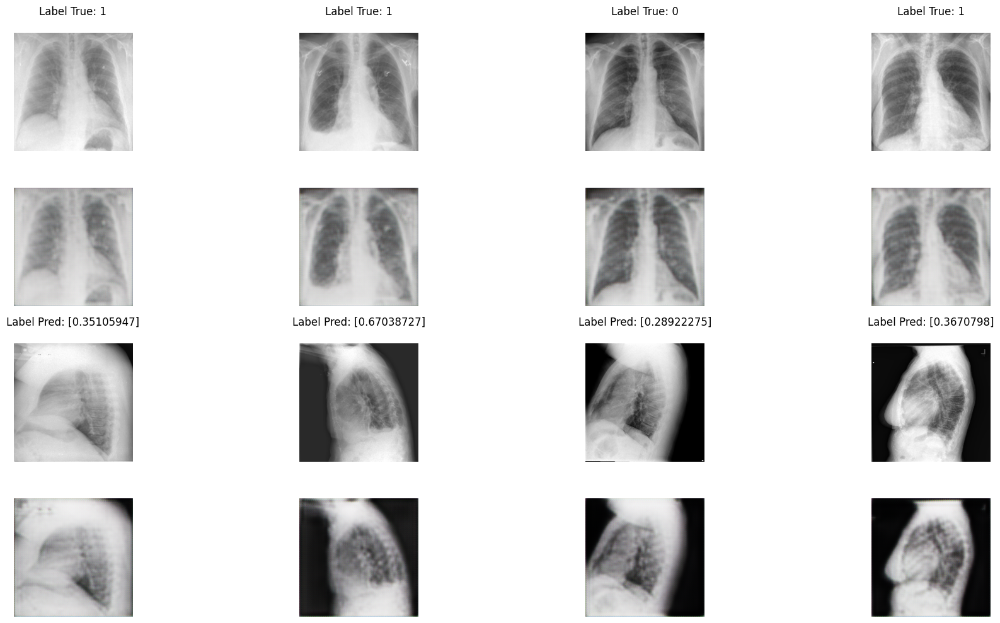

330/330 ━━━━━━━━━━━━━━━━━━━━ 521s 1s/step - accuracy: 0.6922 - classification_loss: 0.5901 - frontal_loss: 0.3206 - lateral_loss: 0.3059 - loss: 1.2404 - precision: 0.5352 - recall: 0.2155 - text_generation_loss: 0.3370 - val_accuracy: 0.7350 - val_classification_loss: 0.5018 - val_frontal_loss: 0.2936 - val_lateral_loss: 0.2366 - val_loss: 0.7955 - val_precision: 0.7812 - val_recall: 0.2688 - val_text_generation_loss: 0.0287 - learning_rate: 1.0000e-04
Epoch 2/8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step/step - accuracy: 0.7401 - classification_loss: 0.5424 - frontal_loss: 0.2905 - lateral_loss: 0.2327 - loss: 0.8346 - precision: 0.6739 - recall: 0.3872 - text_generation_loss: 0.030
Predicted: No acute cardiopulmonary abnormality seen.
Original: No acute cardiopulmonary findings. .


Predicted: No evidence of active disease.
Original: Normal heart size and normal mediastinal contours. Normal pulmonary vasculature. No XXXX of pleural effusions. No infiltrates. Normal X-XXXX of chest.


Pred

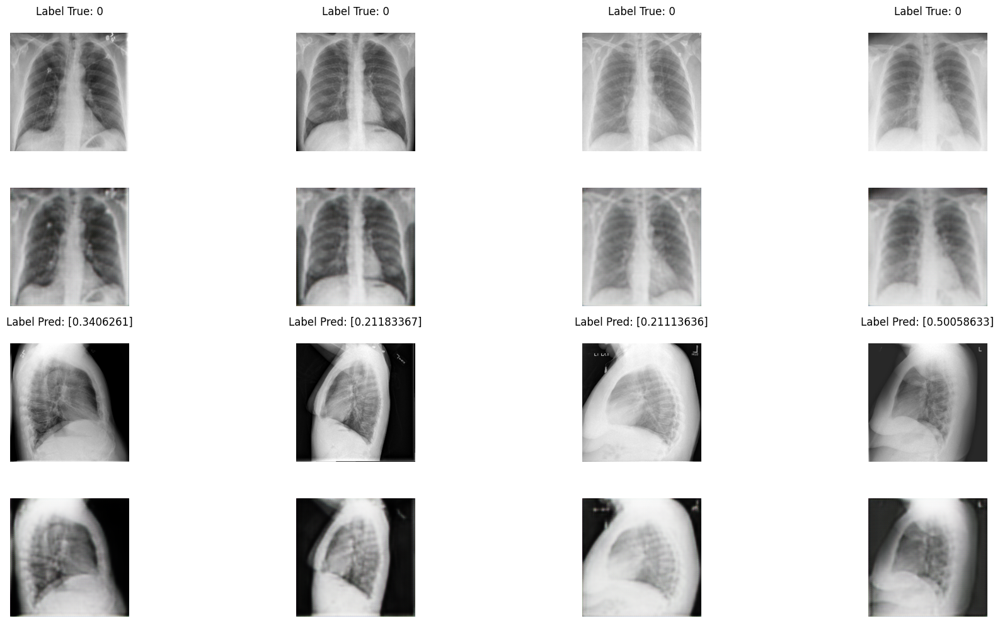

330/330 ━━━━━━━━━━━━━━━━━━━━ 277s 834ms/step - accuracy: 0.7401 - classification_loss: 0.5423 - frontal_loss: 0.2905 - lateral_loss: 0.2327 - loss: 0.8345 - precision: 0.6740 - recall: 0.3875 - text_generation_loss: 0.0306 - val_accuracy: 0.7880 - val_classification_loss: 0.4688 - val_frontal_loss: 0.2912 - val_lateral_loss: 0.2331 - val_loss: 0.7550 - val_precision: 0.8000 - val_recall: 0.4731 - val_text_generation_loss: 0.0240 - learning_rate: 1.0000e-04
Epoch 3/8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step/step - accuracy: 0.7741 - classification_loss: 0.4819 - frontal_loss: 0.2893 - lateral_loss: 0.2316 - loss: 0.7694 - precision: 0.7279 - recall: 0.4863 - text_generation_loss: 0.027
Predicted: Negative atelectasis. Negative for acute cardiopulmonary disease.
Original: No acute cardiopulmonary process.


Predicted: Normal chest
Original: No active disease.


Predicted: No acute cardiopulmonary disease.
Original: No evidence of acute cardiopulmonary process.


Predicted: No acute cardiopu

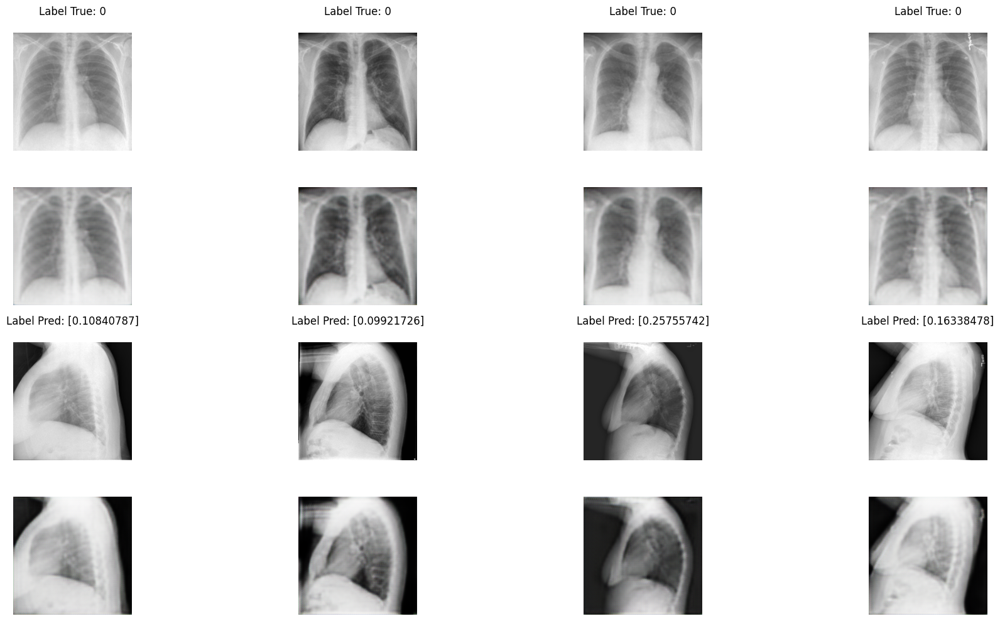

330/330 ━━━━━━━━━━━━━━━━━━━━ 275s 828ms/step - accuracy: 0.7741 - classification_loss: 0.4820 - frontal_loss: 0.2893 - lateral_loss: 0.2316 - loss: 0.7694 - precision: 0.7280 - recall: 0.4865 - text_generation_loss: 0.0270 - val_accuracy: 0.7880 - val_classification_loss: 0.4621 - val_frontal_loss: 0.2882 - val_lateral_loss: 0.2325 - val_loss: 0.7455 - val_precision: 0.8113 - val_recall: 0.4624 - val_text_generation_loss: 0.0230 - learning_rate: 1.0000e-04
Epoch 4/8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step/step - accuracy: 0.7950 - classification_loss: 0.4649 - frontal_loss: 0.2891 - lateral_loss: 0.2304 - loss: 0.7450 - precision: 0.7887 - recall: 0.5873 - text_generation_loss: 0.020
Predicted: No acute disease.
Original: No acute cardiopulmonary abnormality.


Predicted: No acute cardiopulmonary abnormality.
Original: No acute cardiopulmonary abnormality.


Predicted: 1. Low lung volume study without overt pneumonia. 2. Right mid lung base. 3. No acute cardiopulmonary abnormality.
Origi

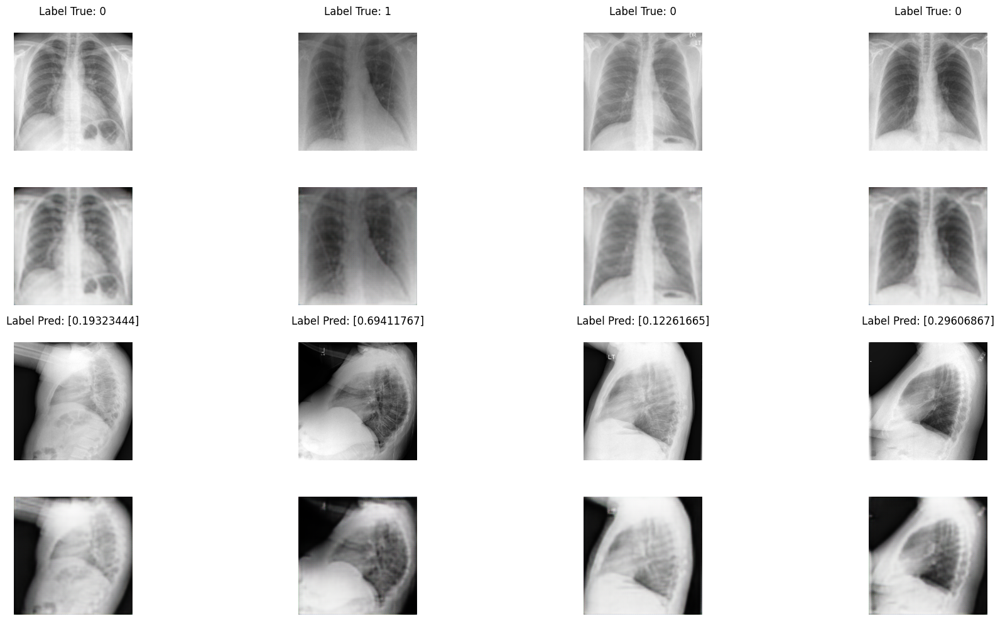

330/330 ━━━━━━━━━━━━━━━━━━━━ 277s 834ms/step - accuracy: 0.7950 - classification_loss: 0.4649 - frontal_loss: 0.2891 - lateral_loss: 0.2304 - loss: 0.7450 - precision: 0.7887 - recall: 0.5874 - text_generation_loss: 0.0204 - val_accuracy: 0.8021 - val_classification_loss: 0.4574 - val_frontal_loss: 0.2881 - val_lateral_loss: 0.2319 - val_loss: 0.7402 - val_precision: 0.7681 - val_recall: 0.5699 - val_text_generation_loss: 0.0228 - learning_rate: 1.0000e-05
Epoch 5/8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step/step - accuracy: 0.8035 - classification_loss: 0.4573 - frontal_loss: 0.2885 - lateral_loss: 0.2294 - loss: 0.7344 - precision: 0.8045 - recall: 0.6011 - text_generation_loss: 0.018
Predicted: Minimal left basilar opacity XXXX, XXXX mild pulmonary nodule opacity, XXXX mild right pleural effusion. Stable cardiac silhouette consistent with old granulomatous disease. No definite edema. Pulmonary contour versus
Original: No acute cardiopulmonary findings. .


Predicted: No acute cardiopulmo

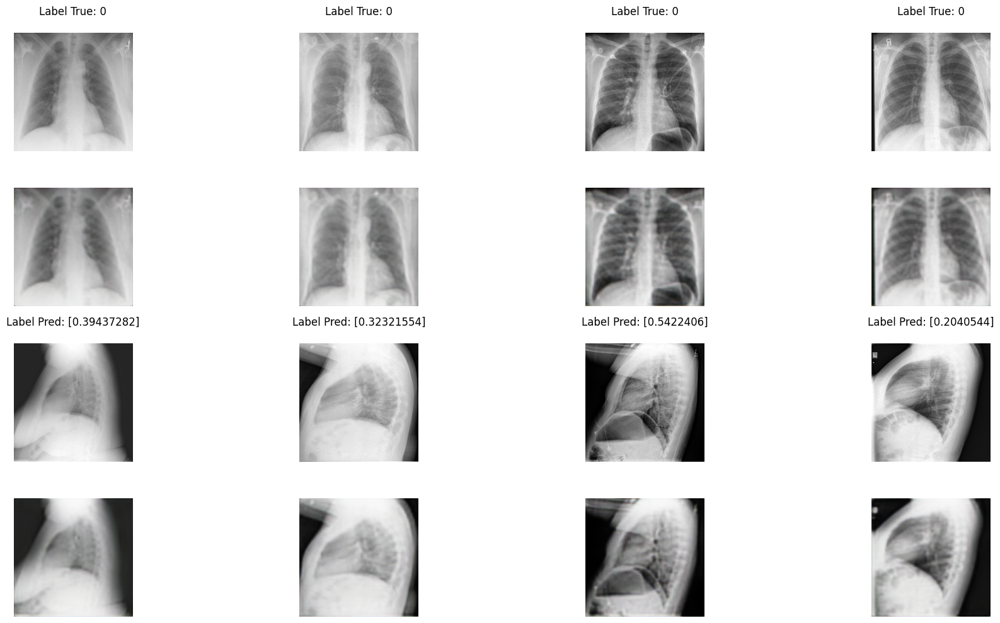

330/330 ━━━━━━━━━━━━━━━━━━━━ 285s 860ms/step - accuracy: 0.8035 - classification_loss: 0.4573 - frontal_loss: 0.2885 - lateral_loss: 0.2294 - loss: 0.7343 - precision: 0.8045 - recall: 0.6010 - text_generation_loss: 0.0181 - val_accuracy: 0.7845 - val_classification_loss: 0.4665 - val_frontal_loss: 0.2880 - val_lateral_loss: 0.2319 - val_loss: 0.7500 - val_precision: 0.6860 - val_recall: 0.6344 - val_text_generation_loss: 0.0236 - learning_rate: 1.0000e-05
Epoch 6/8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step/step - accuracy: 0.8087 - classification_loss: 0.4345 - frontal_loss: 0.2878 - lateral_loss: 0.2303 - loss: 0.7092 - precision: 0.7500 - recall: 0.6086 - text_generation_loss: 0.015
Predicted: 1. No acute radiographic cardiopulmonary process.
Original: Negative chest .


Predicted: Heart size as a chest tube. No elevation or chest. No focal consolidation of pleural effusions.
Original: No acute cardiopulmonary abnormality. .


Predicted: 1. No acute radiographic cardiopulmonary process.

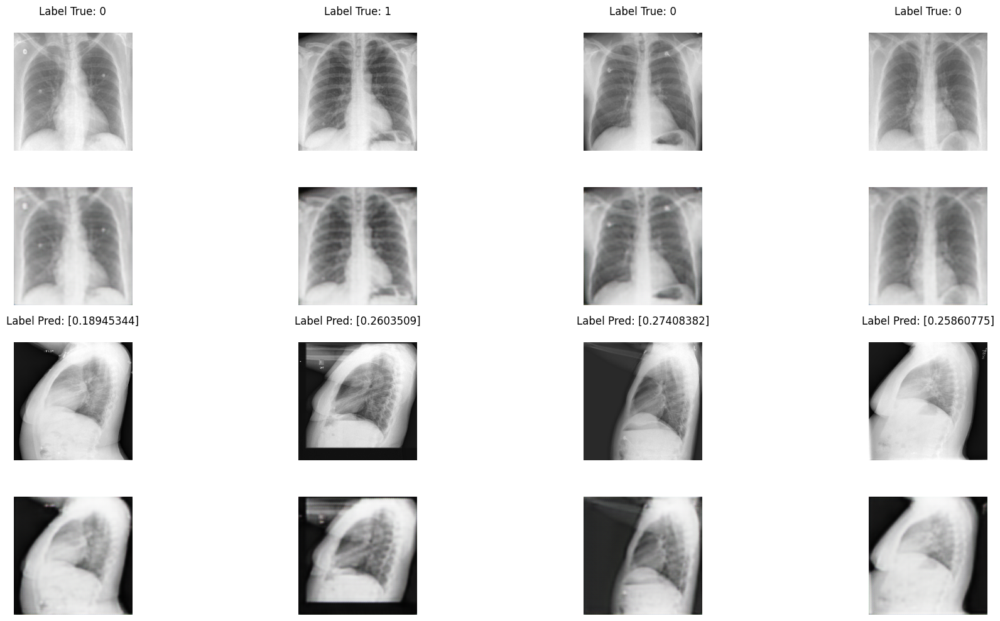

330/330 ━━━━━━━━━━━━━━━━━━━━ 278s 837ms/step - accuracy: 0.8087 - classification_loss: 0.4345 - frontal_loss: 0.2878 - lateral_loss: 0.2303 - loss: 0.7092 - precision: 0.7501 - recall: 0.6085 - text_generation_loss: 0.0157 - val_accuracy: 0.7915 - val_classification_loss: 0.4578 - val_frontal_loss: 0.2880 - val_lateral_loss: 0.2318 - val_loss: 0.7418 - val_precision: 0.7237 - val_recall: 0.5914 - val_text_generation_loss: 0.0242 - learning_rate: 1.0000e-05
Epoch 7/8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step/step - accuracy: 0.8141 - classification_loss: 0.4460 - frontal_loss: 0.2874 - lateral_loss: 0.2301 - loss: 0.7192 - precision: 0.7711 - recall: 0.6559 - text_generation_loss: 0.014
Predicted: No acute cardiopulmonary process. Probable XXXX residual fibrotic and degenerative changes of the left foot.
Original: No acute findings.


Predicted: No acute cardiopulmonary abnormality.
Original: Heart size is normal and lungs are clear


Predicted: Normal chest
Original: 1. No acute radiograph

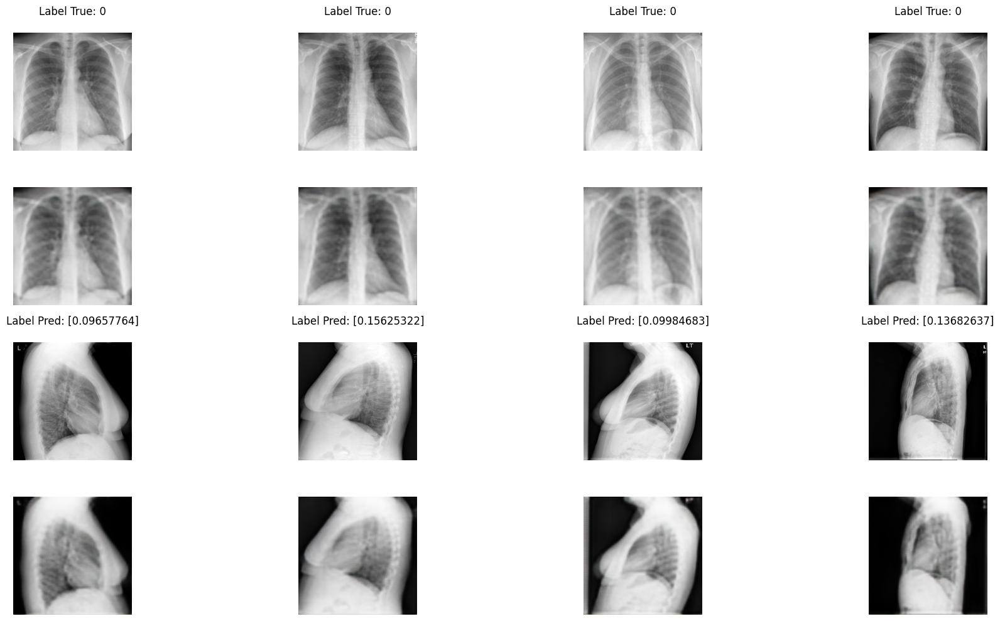

330/330 ━━━━━━━━━━━━━━━━━━━━ 276s 831ms/step - accuracy: 0.8141 - classification_loss: 0.4460 - frontal_loss: 0.2874 - lateral_loss: 0.2301 - loss: 0.7191 - precision: 0.7712 - recall: 0.6558 - text_generation_loss: 0.0144 - val_accuracy: 0.7915 - val_classification_loss: 0.4560 - val_frontal_loss: 0.2880 - val_lateral_loss: 0.2317 - val_loss: 0.7408 - val_precision: 0.7361 - val_recall: 0.5699 - val_text_generation_loss: 0.0250 - learning_rate: 1.0000e-05
Epoch 8/8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step/step - accuracy: 0.7826 - classification_loss: 0.4608 - frontal_loss: 0.2872 - lateral_loss: 0.2305 - loss: 0.7325 - precision: 0.7467 - recall: 0.5762 - text_generation_loss: 0.012
Predicted: No acute abnormality identified.
Original: No acute cardiopulmonary disease. No evidence for metastatic disease by radiographic evaluation.


Predicted: No acute disease.
Original: Negative for acute abnormality.


Predicted: No acute cardiopulmonary abnormality.
Original: No acute cardiopulmonary

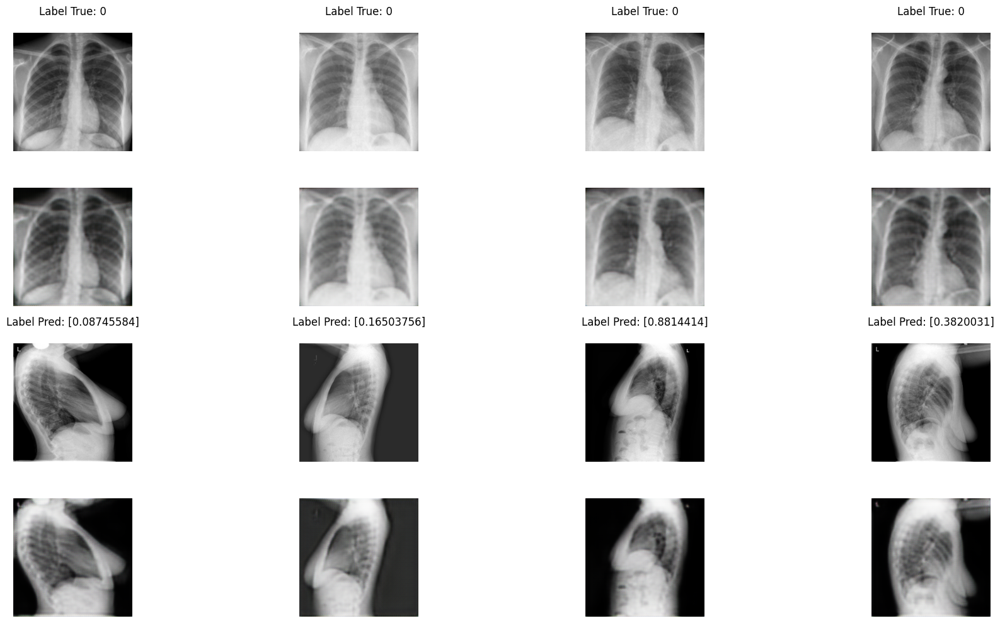

330/330 ━━━━━━━━━━━━━━━━━━━━ 273s 822ms/step - accuracy: 0.7827 - classification_loss: 0.4608 - frontal_loss: 0.2872 - lateral_loss: 0.2305 - loss: 0.7324 - precision: 0.7468 - recall: 0.5763 - text_generation_loss: 0.0128 - val_accuracy: 0.7951 - val_classification_loss: 0.4534 - val_frontal_loss: 0.2880 - val_lateral_loss: 0.2316 - val_loss: 0.7391 - val_precision: 0.7612 - val_recall: 0.5484 - val_text_generation_loss: 0.0259 - learning_rate: 1.0000e-05


In [19]:
# Train the model
history = model.fit(
    train_dataset,
    epochs=8,
    validation_data=val_dataset,
    callbacks=[
        lr_scheduler,
        keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min', restore_best_weights=True),
        keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, mode='min', patience=2),
        VisualizeCallback(validation_data=val_dataset)
    ]
)

## Training Process Analysis

We created two visualization plots to analyze the model's training behavior:

### 1. Training vs Validation Loss Comparison
The first plot compares the total loss between training and validation sets across epochs. This comparison is crucial because:
- It helps detect overfitting: if the validation loss increases while training loss continues to decrease, the model is overfitting
- It confirms learning progress: both curves should generally decrease, indicating the model is learning from the data
- It validates model generalization: similar trends between training and validation suggest good generalization to unseen data
- It helps identify the optimal stopping point: when validation loss plateaus or starts increasing

### 2. Component-wise Loss Analysis
The second plot breaks down the individual losses during training (classification, frontal reconstruction, lateral reconstruction, and text generation). This breakdown is valuable because:
- It shows how each task is progressing relative to others
- It helps identify if any specific component is struggling or dominating the total loss
- It can guide hyperparameter tuning: if one component is performing poorly, we might need to:
  - Adjust its weight in the total loss function
  - Modify the architecture of that specific component
  - Fine-tune learning rates or other parameters specifically for that task

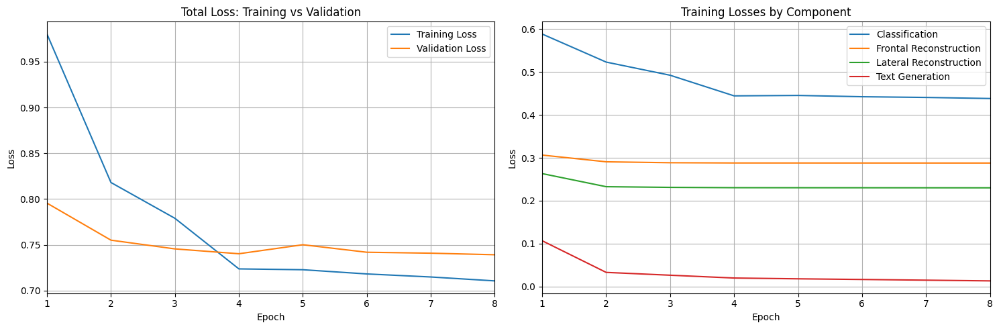


Final Loss Values:
Training Total Loss:   0.7105
Validation Total Loss: 0.7391

Training Component Losses:
- Classification:      0.4384
- Frontal Reconstr.:  0.2879
- Lateral Reconstr.:  0.2301
- Text Generation:    0.0131


In [21]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    """
    Create plots to visualize the training history:
    1. Total loss comparison (train vs validation)
    2. Individual training losses
    
    Args:
        history: Keras history object from model.fit()
    """
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # Get the number of epochs
    epochs = len(history.history['loss'])
    epoch_range = range(1, epochs + 1)  # Start epochs from 1 instead of 0
    
    # Plot 1: Total Loss Comparison
    ax1.plot(epoch_range, history.history['loss'], label='Training Loss')
    ax1.plot(epoch_range, history.history['val_loss'], label='Validation Loss')
    ax1.set_title('Total Loss: Training vs Validation')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)
    ax1.set_xticks(epoch_range)  # Set integer ticks for epochs
    ax1.set_xlim(1, epochs)  # Adjust x-axis limits to match the data exactly
    
    # Plot 2: Individual Training Losses
    ax2.plot(epoch_range, history.history['classification_loss'], label='Classification')
    ax2.plot(epoch_range, history.history['frontal_loss'], label='Frontal Reconstruction')
    ax2.plot(epoch_range, history.history['lateral_loss'], label='Lateral Reconstruction')
    ax2.plot(epoch_range, history.history['text_generation_loss'], label='Text Generation')
    ax2.set_title('Training Losses by Component')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)
    ax2.set_xticks(epoch_range)  # Set integer ticks for epochs
    ax2.set_xlim(1, epochs)  # Adjust x-axis limits to match the data exactly
        
    plt.tight_layout()
    plt.show()
    
    # Print final loss values
    print("\nFinal Loss Values:")
    print("=" * 50)
    print(f"Training Total Loss:   {history.history['loss'][-1]:.4f}")
    print(f"Validation Total Loss: {history.history['val_loss'][-1]:.4f}")
    print("\nTraining Component Losses:")
    print(f"- Classification:      {history.history['classification_loss'][-1]:.4f}")
    print(f"- Frontal Reconstr.:  {history.history['frontal_loss'][-1]:.4f}")
    print(f"- Lateral Reconstr.:  {history.history['lateral_loss'][-1]:.4f}")
    print(f"- Text Generation:    {history.history['text_generation_loss'][-1]:.4f}")

plot_training_history(history)

## Evaluate Images Reconstruction on <code>test_dataset</code>


Reconstruction Evaluation Results:
Frontal View:
  MSE: 0.000486
  SSIM: 0.885554

Lateral View:
  MSE: 0.000885
  SSIM: 0.859254


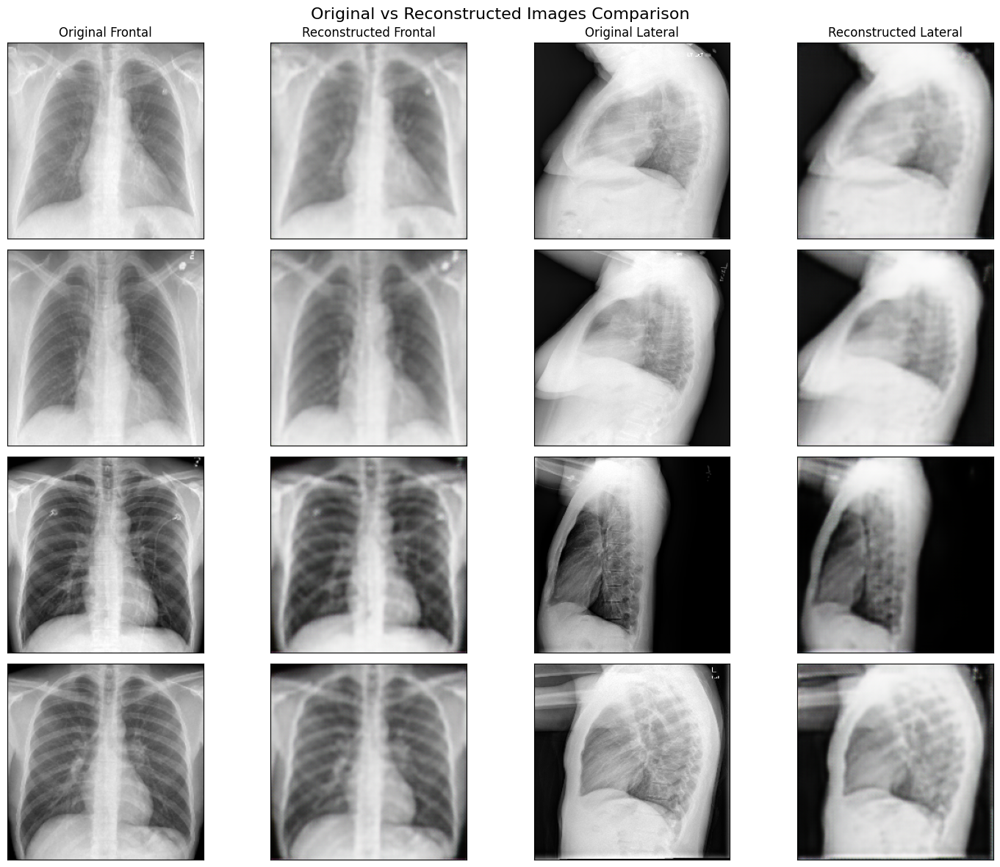

In [24]:
import tensorflow as tf
from tensorflow.image import ssim
import numpy as np
import matplotlib.pyplot as plt

def plot_reconstruction_comparison(original_frontal, original_lateral, 
                                 reconstructed_frontal, reconstructed_lateral,
                                 num_samples=5):
    """
    Plot original and reconstructed images side by side.
    """
    # Determine the actual number of samples available
    batch_size = original_frontal.shape[0]
    num_samples = min(num_samples, batch_size)
    
    # Take only the specified number of samples
    orig_frontal = original_frontal[:num_samples]
    orig_lateral = original_lateral[:num_samples]
    recon_frontal = reconstructed_frontal[:num_samples]
    recon_lateral = reconstructed_lateral[:num_samples]
    
    # Create a figure with subplots
    fig, axes = plt.subplots(num_samples, 4, figsize=(15, 3*num_samples))
    fig.suptitle('Original vs Reconstructed Images Comparison', fontsize=16)
    
    # Handle case where num_samples = 1
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    # Set column titles
    axes[0, 0].set_title('Original Frontal')
    axes[0, 1].set_title('Reconstructed Frontal')
    axes[0, 2].set_title('Original Lateral')
    axes[0, 3].set_title('Reconstructed Lateral')
    
    # Plot each sample
    for i in range(num_samples):
        # Convert tensors to numpy if needed
        o_frontal = orig_frontal[i].numpy() if hasattr(orig_frontal[i], 'numpy') else orig_frontal[i]
        o_lateral = orig_lateral[i].numpy() if hasattr(orig_lateral[i], 'numpy') else orig_lateral[i]
        r_frontal = recon_frontal[i].numpy() if hasattr(recon_frontal[i], 'numpy') else recon_frontal[i]
        r_lateral = recon_lateral[i].numpy() if hasattr(recon_lateral[i], 'numpy') else recon_lateral[i]
        
        # Plot frontal view comparison
        axes[i, 0].imshow(o_frontal, cmap='gray')
        axes[i, 1].imshow(r_frontal, cmap='gray')
        
        # Plot lateral view comparison
        axes[i, 2].imshow(o_lateral, cmap='gray')
        axes[i, 3].imshow(r_lateral, cmap='gray')
        
        # Remove axes ticks
        for ax in axes[i]:
            ax.set_xticks([])
            ax.set_yticks([])
    
    plt.tight_layout()
    plt.show()

def evaluate_reconstruction(model, test_dataset, plot_samples=True, num_samples=5):
    """
    Evaluate the model's image reconstruction quality on the test dataset.
    """
    total_mse_frontal = 0
    total_mse_lateral = 0
    total_ssim_frontal = 0
    total_ssim_lateral = 0
    total_samples = 0
    
    # Store the last batch for visualization
    last_batch = None
    last_predictions = None
    
    for batch in test_dataset:
        # Get original images
        original_images = batch["images"]  # Shape: (batch_size, 2, height, width, channels)
        original_frontal = original_images[:, 0]
        original_lateral = original_images[:, 1]
        
        # Get reconstructed images
        predictions = model(batch)
        reconstructed_frontal = predictions["reconstructed_frontal"]
        reconstructed_lateral = predictions["reconstructed_lateral"]
        
        # Store last batch for visualization
        last_batch = batch
        last_predictions = predictions
        
        # Calculate MSE
        mse_frontal = tf.reduce_mean(tf.square(original_frontal - reconstructed_frontal))
        mse_lateral = tf.reduce_mean(tf.square(original_lateral - reconstructed_lateral))
        
        # Calculate SSIM (values range from -1 to 1, where 1 means identical images)
        ssim_frontal = tf.reduce_mean(ssim(original_frontal, reconstructed_frontal, max_val=1.0))
        ssim_lateral = tf.reduce_mean(ssim(original_lateral, reconstructed_lateral, max_val=1.0))
        
        # Update totals
        total_mse_frontal += float(mse_frontal)
        total_mse_lateral += float(mse_lateral)
        total_ssim_frontal += float(ssim_frontal)
        total_ssim_lateral += float(ssim_lateral)
        total_samples += 1
    
    # Calculate averages
    avg_mse_frontal = total_mse_frontal / total_samples
    avg_mse_lateral = total_mse_lateral / total_samples
    avg_ssim_frontal = total_ssim_frontal / total_samples
    avg_ssim_lateral = total_ssim_lateral / total_samples
    
    results = {
        "frontal_view": {
            "mse": avg_mse_frontal,
            "ssim": avg_ssim_frontal
        },
        "lateral_view": {
            "mse": avg_mse_lateral,
            "ssim": avg_ssim_lateral
        }
    }
    
    # Print results
    print("\nReconstruction Evaluation Results:")
    print("=" * 50)
    print("Frontal View:")
    print(f"  MSE: {avg_mse_frontal:.6f}")
    print(f"  SSIM: {avg_ssim_frontal:.6f}")
    print("\nLateral View:")
    print(f"  MSE: {avg_mse_lateral:.6f}")
    print(f"  SSIM: {avg_ssim_lateral:.6f}")
    
    # Plot sample comparisons if requested
    if plot_samples and last_batch is not None:
        original_images = last_batch["images"]
        original_frontal = original_images[:, 0]
        original_lateral = original_images[:, 1]
        reconstructed_frontal = last_predictions["reconstructed_frontal"]
        reconstructed_lateral = last_predictions["reconstructed_lateral"]
        
        # Plot original vs reconstructed comparisons
        plot_reconstruction_comparison(
            original_frontal, original_lateral,
            reconstructed_frontal, reconstructed_lateral,
            num_samples=num_samples
        )
    
    return results

# Example usage:
reconstruction_metrics = evaluate_reconstruction(model, test_dataset, plot_samples=True)

## Evaluate Classification on <code>test_dataset</code>

In [20]:
def evaluate_tag_predictions(model, test_dataset):
    """
    Evaluate the model's tag predictions on the test dataset.
    """
    total_samples = 0
    correct_matches = 0
    
    for batch in test_dataset:
        batch_true_tags=batch["labels"]
        predictions = model.predict({"images": batch["images"]})
        binary_predictions = tf.cast(predictions['classification'] > 0.5, tf.float32)

        # Ensure both tensors are the same type for comparison
        batch_true_tags = tf.cast(batch_true_tags, tf.float32)
        
        binary_predictions = tf.squeeze(binary_predictions, axis=-1)
        
        # Compare the tensors
        matches = tf.reduce_sum(tf.cast(tf.equal(binary_predictions, batch_true_tags), tf.float32))
        correct_matches += int(matches)
        total_samples += batch_true_tags.shape[0]
    
    accuracy = correct_matches / total_samples
    wrong_predictions = total_samples - correct_matches
    
    results = {
        "total_predictions": total_samples,
        "correct_predictions": correct_matches,
        "wrong_predictions": wrong_predictions,
        "accuracy": accuracy
        }
    
    return results
    
        
results = evaluate_tag_predictions(model, test_dataset)
print(f"Total predictions: {results['total_predictions']}")
print(f"Correct predictions: {results['correct_predictions']}")
print(f"Wrong predictions: {results['wrong_predictions']}")
print(f"Accuracy: {results['accuracy']:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

## Evaluate Text Generation on <code>test_dataset</code>

In [ ]:
!pip install rouge_score

In [41]:
import nltk
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from rouge_score import rouge_scorer

# Smoothing function for BLEU
smoothing_function = SmoothingFunction().method1

print("\n" + "=" * 50 + "\n")

# Initialize ROUGE scorer
scorer = rouge_scorer.RougeScorer(['rougeL'], use_stemmer=True)

# Lists to collect references and hypotheses
all_references = []
all_hypotheses = []
rouge_l_scores = []

# Iterate through the first batch of the test dataset
for batch in test_dataset:
    input_images = batch["images"]  # Shape: (batch_size, 2, height, width, channels)
    original_impressions = batch["impressions"]  # Shape: (batch_size,)
    classification = model.predict({"images": input_images})["classification"]
    tokenizer = gpt2_model.preprocessor.tokenizer  # Access the tokenizer
    generated = []
    # Iterate through each example in the batch
    for i in range(input_images.shape[0]):
        # Extract single example
        single_input_images = {
            "images": input_images[i][tf.newaxis, ...],  # Add batch dimension
        }
        if classification[i] >= 0.5:
            outputs = model.generate_text(single_input_images, max_length=50, temperature=0.2, top_k=20)
        else:
            outputs = model.generate_text(single_input_images, max_length=50, temperature=1.0, top_k=20)
        generated_tokens = outputs["generated_text"]
        generated_text = tokenizer.detokenize(generated_tokens)  # List of strings
        generated.append(generated_text)

    # Function to truncate text at <|endoftext|>
    def truncate_at_endoftext(text):
        if isinstance(text, list):  # If it's a list, apply the function to each element
            return [truncate_at_endoftext(item) for item in text]
        endoftext_index = text.find('<|endoftext|>')
        if endoftext_index != -1:
            return text[:endoftext_index]
        return text

    # Truncate generated text
    truncated_generated_text = truncate_at_endoftext(generated)

    # Tokenize generated and original texts and calculate ROUGE-L
    for gen_text, ref_text in zip(truncated_generated_text, original_impressions.numpy()):
        # Decode the original reference
        ref_text_decoded = ref_text.decode("utf-8")
        # Calculate ROUGE-L
        rouge_scores = scorer.score(ref_text_decoded, gen_text[0])
        rouge_l_scores.append(rouge_scores['rougeL'].fmeasure)
        # Tokenize and add to the list for BLEU
        all_references.append([ref_text_decoded.split()])  # Each reference must be a list of lists
        all_hypotheses.append(gen_text[0].split())

    # Print the results
    print("Predicted:")
    for text in truncated_generated_text:
        print(text[0])
    print("\nOriginal:")
    for text in original_impressions.numpy():
        print(text.decode("utf-8"))

    print("\n" + "=" * 50 + "\n")

# Calculate BLEU scores for the entire batch
bleu1 = corpus_bleu(all_references, all_hypotheses, weights=(1, 0, 0, 0), smoothing_function=smoothing_function)
bleu2 = corpus_bleu(all_references, all_hypotheses, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothing_function)
bleu3 = corpus_bleu(all_references, all_hypotheses, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothing_function)
bleu4 = corpus_bleu(all_references, all_hypotheses, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothing_function)

# Calculate average ROUGE-L
average_rouge_l = sum(rouge_l_scores) / len(rouge_l_scores)

# Print final results
print("\n" + "=" * 50 + "\n")
print(f"BLEU-1: {bleu1}")
print(f"BLEU-2: {bleu2}")
print(f"BLEU-3: {bleu3}")
print(f"BLEU-4: {bleu4}")
print(f"ROUGE-L: {average_rouge_l}")
print("\n" + "=" * 50 + "\n")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predicted:
No acute cardiopulmonary abnormality.
No acute cardiopulmonary findings.
No acute cardiopulmonary abnormality.
No acute cardiopulmonary process. Specifically, no radiographically acute cardiopulmonary finding.

Original:
1. Moderate right pleural effusion.
Heart size is normal and lungs are clear.
No acute cardiopulmonary findings. .
No acute cardiopulmonary findings


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted:
1. No acute radiographic cardiopulmonary process.
No active disease.
Heart normal in both lungs. Minimal basilar airspace disease within the right lung and lingular atelectasis, otherwise clear.
No acute cardiopulmonary abnormality.

Original:
No comparison chest x-XXXX. No evidence of active tuberculosis. Well-expanded and clear lungs. Mediastinal contour within normal limits. No acute cardiopulmonary abnormality identified.
No acute cardiopulmonary finding.
Emphysematous changes without acute cardiopulmonary disease.
Sta

## Latent Space Visualization with t-SNE

### Code Overview
This code creates visualizations of the latent space representations learned by our model for medical images. It performs two main visualizations:

1. A scatter plot showing the distribution of normal vs. abnormal cases in the latent space
2. A density plot showing the concentration of data points across the latent space

The visualization includes sample thumbnails of the original images positioned at their corresponding locations in the latent space, helping to understand what kinds of images are clustered together.

### What is t-SNE?
t-SNE (t-Distributed Stochastic Neighbor Embedding) is a dimensionality reduction technique particularly well-suited for visualizing high-dimensional data. Key aspects:

- Reduces high-dimensional data (in our case, 1024-dimensional latent vectors) to 2D or 3D for visualization
- Preserves local structure: similar points in high-dimensional space remain close in the reduced space
- Particularly good at revealing clusters and patterns in the data
- Non-linear technique: can capture complex relationships that linear methods might miss

In our medical imaging context, t-SNE helps visualize how the model organizes different types of medical images in its latent space, potentially revealing clusters of similar pathologies or anatomical features.

Creating t-SNE visualization...
Performing t-SNE dimensionality reduction...


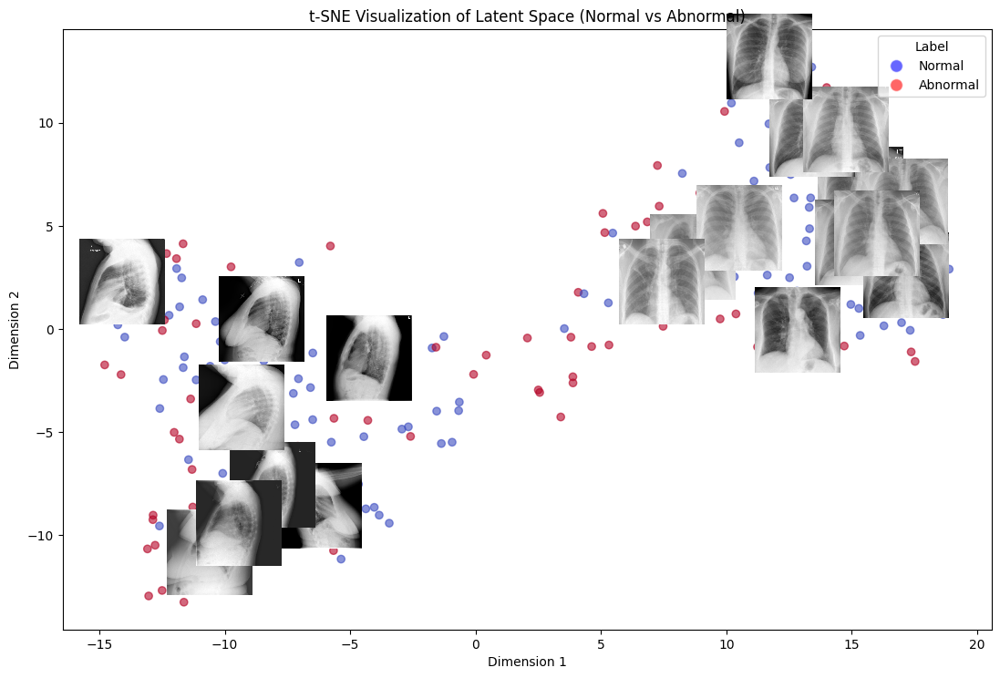

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


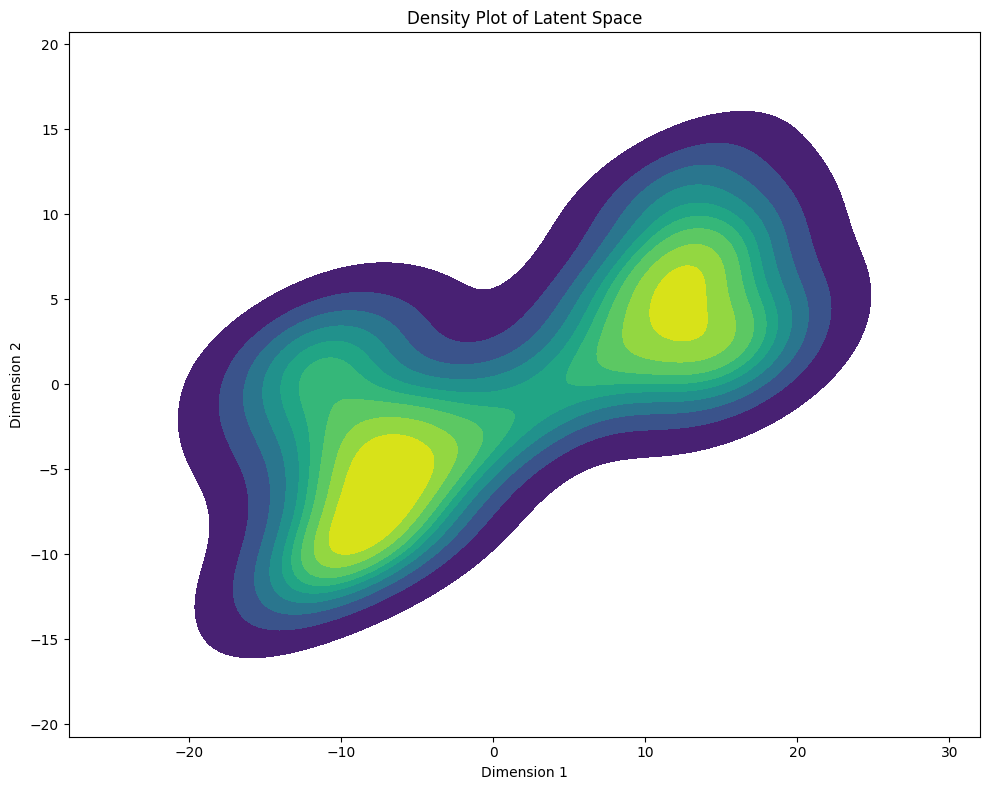

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
import seaborn as sns
import pandas as pd
from matplotlib.lines import Line2D  # For custom legend

def visualize_latent_space_2d(model, dataset, n_samples=1000, batch_size=32):
    """
    Create a 2D visualization of the latent space using dimensionality reduction for both frontal and lateral views.
    Args:
        model: The trained multi input/output model
        dataset: Dataset containing the paired images and labels
        n_samples: Number of samples to use for visualization
        batch_size: Size of batches to process
    """
    # Collect latent vectors, images, and labels
    latent_vectors = []
    images = []
    labels = []
    views = []  # To keep track of whether the image is frontal or lateral
    
    for batch in dataset.take(n_samples // batch_size + 1):
        # Extract both views (frontal and lateral)
        batch_paired_images = batch["images"]
        batch_paired_labels = batch["labels"]
        frontal_images = batch_paired_images[:, 0, :, :, :]
        lateral_images = batch_paired_images[:, 1, :, :, :]
        
        frontal, _, _, _, _, _ = model.encoder(frontal_images)
        lateral, _, _, _, _, _ = model.encoder(lateral_images)
        
        latent_vectors.append(frontal)
        latent_vectors.append(lateral)
        
        images.extend(frontal_images.numpy())
        images.extend(lateral_images.numpy())
        
        labels.extend(batch_paired_labels.numpy())
        labels.extend(batch_paired_labels.numpy())  # Duplicate labels for both views
        
        views.extend(['frontal'] * len(frontal_images))
        views.extend(['lateral'] * len(lateral_images))
        
        if len(images) >= n_samples:
            break
            
    # Combine all batches
    latent_vectors = np.vstack(latent_vectors)[:n_samples]
    images = np.array(images)[:n_samples]
    labels = np.array(labels)[:n_samples]
    views = np.array(views)[:n_samples]
    
    # Reduce dimensionality to 2D
    print("Performing t-SNE dimensionality reduction...")
    reducer = TSNE(n_components=2, random_state=42)
    embedding = reducer.fit_transform(latent_vectors)
    title = 't-SNE Visualization of Latent Space (Normal vs Abnormal)'
    
    # Create main scatter plot
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(embedding[:, 0], embedding[:, 1], 
                          c=labels, cmap='coolwarm', alpha=0.6)
    
    # Custom legend for binary labels
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', label='Normal', 
               markerfacecolor='blue', markersize=10, alpha=0.6),
        Line2D([0], [0], marker='o', color='w', label='Abnormal', 
               markerfacecolor='red', markersize=10, alpha=0.6)
    ]
    plt.legend(handles=legend_elements, title='Label', loc='best')
    
    plt.title(title)
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    
    # Add sample images around the plot
    n_samples_to_show = 20
    sample_indices = np.random.choice(len(images), n_samples_to_show, replace=False)
    
    for idx in sample_indices:
        x, y = embedding[idx]
        img = images[idx]
        
        # Scale image to fit within the plot
        img = np.clip(img, 0, 1)  # Ensure image is normalized
        imagebox = OffsetImage(img, zoom=0.3, cmap='gray')  # Adjust `zoom` to control size
        ab = AnnotationBbox(imagebox, (x, y), frameon=False, pad=0.1)
        plt.gca().add_artist(ab)

    plt.tight_layout()
    plt.show()
    
    # Replace infinite values with NaN in the embedding
    embedding_df = pd.DataFrame(embedding, columns=['Dimension 1', 'Dimension 2'])
    embedding_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Drop rows with NaN values to avoid issues
    embedding_df.dropna(inplace=True)
    
    # Create density plot
    plt.figure(figsize=(10, 8))
    sns.kdeplot(data=embedding_df, x='Dimension 1', y='Dimension 2', cmap='viridis', fill=True)
    plt.title('Density Plot of Latent Space')
    plt.tight_layout()
    plt.show()

# Example usage:
print("Creating t-SNE visualization...")
visualize_latent_space_2d(model, test_dataset)

# Transformer Architecture Implementation

## Core Components

### 1. Positional Encoding
- Adds information about token positions in the sequence
- Uses sine and cosine functions to create unique positional embeddings
- Helps the model understand sequence order since attention has no inherent notion of position

### 2. Multi-Head Attention
- Splits input into multiple heads for parallel attention computation
- Consists of three main operations:
  - Query (Q), Key (K), and Value (V) transformations
  - Scaled dot-product attention mechanism
  - Final linear transformation to combine heads
- Allows the model to focus on different parts of the sequence simultaneously

### 3. Feed-Forward Network
- Two-layer neural network applied to each position separately
- First layer expands the dimension (dff > d_model)
- Second layer projects back to model dimension
- Uses ReLU activation in between layers

### 4. Transformer Block
- Combines multi-head attention and feed-forward network
- Uses residual connections around each sub-layer
- Applies layer normalization after each residual connection
- Includes dropout for regularization

### 5. Encoder
- Stack of identical transformer blocks
- Processes input sequence in parallel
- Each block contains:
  - Multi-head self-attention mechanism
  - Position-wise feed-forward network

### 6. Decoder
- Similar structure to encoder but with additional attention layer
- Processes target sequence
- Uses masking to prevent attending to future tokens during training

### 7. Complete Transformer
- Combines encoder and decoder
- Final linear layer and softmax for output prediction
- Implements custom learning rate schedule with warmup steps
- Uses label smoothing and gradient clipping for stable training

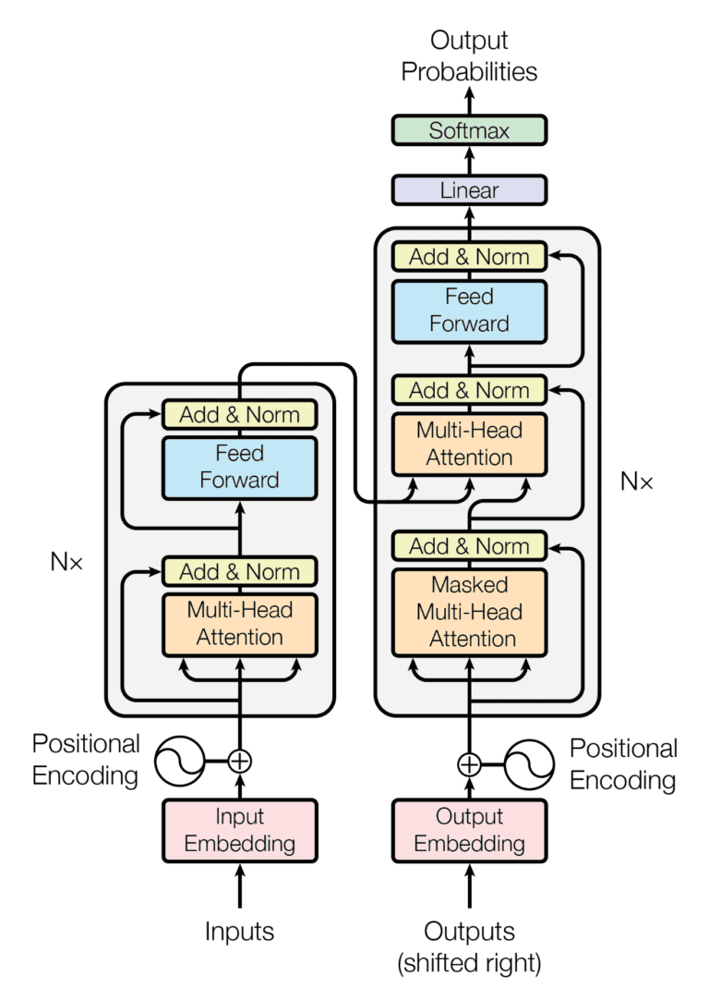
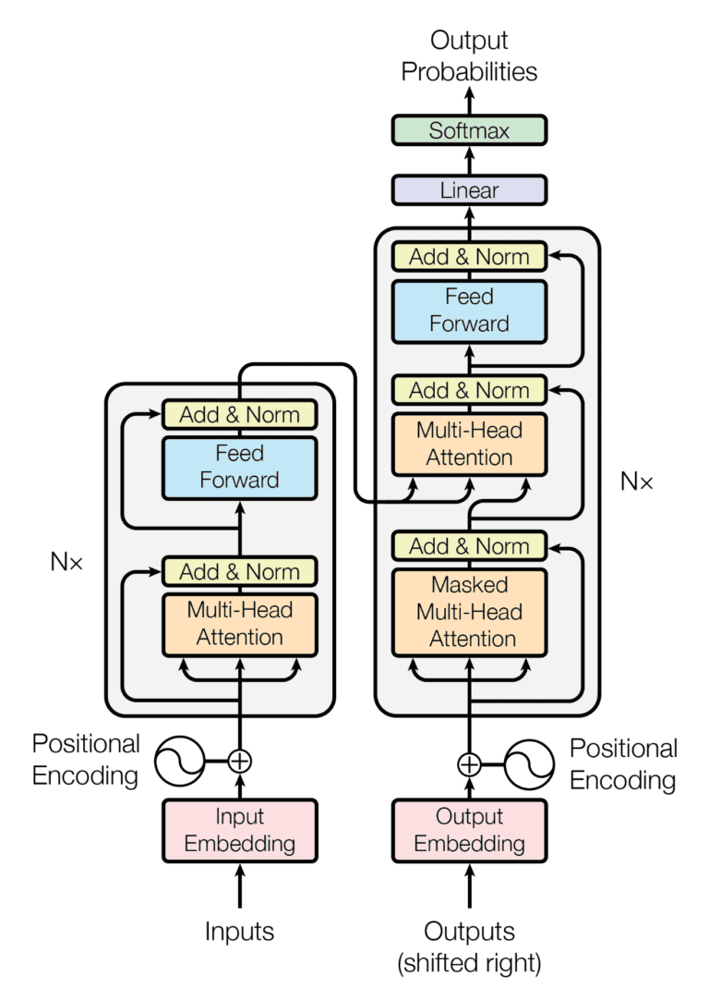

In [6]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input, Embedding, Dropout, LayerNormalization
from tensorflow.keras.models import Model
import numpy as np

# Positional Encoding
def positional_encoding(position, d_model):
    angle_rads = np.arange(position)[:, np.newaxis] / np.power(10000, (2 * (np.arange(d_model) // 2)) / np.float32(d_model))
    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    return tf.cast(angle_rads[np.newaxis, ...], dtype=tf.float32)

# Multi-Head Attention
class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        assert d_model % num_heads == 0

        self.depth = d_model // num_heads
        self.wq = Dense(d_model)
        self.wk = Dense(d_model)
        self.wv = Dense(d_model)
        self.dense = Dense(d_model)

    def split_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, v, k, q, mask):
        batch_size = tf.shape(q)[0]

        q = self.wq(q)
        k = self.wk(k)
        v = self.wv(v)

        q = self.split_heads(q, batch_size)
        k = self.split_heads(k, batch_size)
        v = self.split_heads(v, batch_size)

        attention, attention_weights = self.scaled_dot_product_attention(q, k, v, mask)

        attention = tf.transpose(attention, perm=[0, 2, 1, 3])
        attention = tf.reshape(attention, (batch_size, -1, self.d_model))
        output = self.dense(attention)
        return output

    def scaled_dot_product_attention(self, q, k, v, mask):
        matmul_qk = tf.matmul(q, k, transpose_b=True)
        dk = tf.cast(tf.shape(k)[-1], tf.float32)
        scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

        if mask is not None:
            scaled_attention_logits += (mask * -1e9)

        attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)
        output = tf.matmul(attention_weights, v)
        return output, attention_weights

# Feed Forward Network
class PositionwiseFeedforward(tf.keras.layers.Layer):
    def __init__(self, d_model, dff):
        super(PositionwiseFeedforward, self).__init__()
        self.d_model = d_model
        self.dff = dff
        self.dense1 = Dense(dff, activation='relu')
        self.dense2 = Dense(d_model)

    def call(self, x):
        x = self.dense1(x)
        x = self.dense2(x)
        return x

# Transformer Block
class TransformerBlock(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, dropout_rate=0.1):
        super(TransformerBlock, self).__init__()
        self.att = MultiHeadAttention(d_model, num_heads)
        self.ffn = PositionwiseFeedforward(d_model, dff)
        self.layernorm1 = LayerNormalization(epsilon=1e-6)
        self.layernorm2 = LayerNormalization(epsilon=1e-6)
        self.dropout1 = Dropout(dropout_rate)
        self.dropout2 = Dropout(dropout_rate)

    def call(self, x, training=False, mask=None):  # Pass `training` and `mask` as keyword arguments
        attn_output = self.att(x, x, x, mask=mask)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        out2 = self.layernorm2(out1 + ffn_output)
        return out2

# Encoder
class Encoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size, maximum_position_encoding, dropout_rate=0.1):
        super(Encoder, self).__init__()
        self.d_model = d_model
        self.num_layers = num_layers
        self.embedding = Embedding(input_vocab_size, d_model)
        self.pos_encoding = positional_encoding(maximum_position_encoding, d_model)
        self.dropout = Dropout(dropout_rate)
        self.enc_layers = [TransformerBlock(d_model, num_heads, dff, dropout_rate) for _ in range(num_layers)]

    def call(self, x, training=False, mask=None):  # Pass `training` and `mask` as keyword arguments
        seq_len = tf.shape(x)[1]
        x = self.embedding(x)
        x += self.pos_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)
        for i in range(self.num_layers):
            x = self.enc_layers[i](x, training=training, mask=mask)
        return x

# Decoder
class Decoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, target_vocab_size, maximum_position_encoding, dropout_rate=0.1):
        super(Decoder, self).__init__()
        self.d_model = d_model
        self.num_layers = num_layers
        self.embedding = Embedding(target_vocab_size, d_model)
        self.pos_encoding = positional_encoding(maximum_position_encoding, d_model)
        self.dropout = Dropout(dropout_rate)
        self.dec_layers = [TransformerBlock(d_model, num_heads, dff, dropout_rate) for _ in range(num_layers)]

    def call(self, x, enc_output, training=False, look_ahead_mask=None, padding_mask=None):  # Pass `training` and `mask` as keyword arguments
        seq_len = tf.shape(x)[1]
        x = self.embedding(x)
        x += self.pos_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)
        for i in range(self.num_layers):
            x = self.dec_layers[i](x, training=training, mask=look_ahead_mask)
        return x

# Transformer Model
class Transformer(Model):
    def __init__(self, num_layers, d_model, num_heads, dff, input_vocab_size, target_vocab_size, pe_input, pe_target, rate=0.1):
        super(Transformer, self).__init__()
        self.encoder = Encoder(num_layers, d_model, num_heads, dff, input_vocab_size, pe_input, rate)
        self.decoder = Decoder(num_layers, d_model, num_heads, dff, target_vocab_size, pe_target, rate)
        self.final_layer = Dense(target_vocab_size)

    def call(self, inputs, targets, training=False, look_ahead_mask=None, padding_mask=None):
        enc_output = self.encoder(inputs, training=training, mask=padding_mask)  # Pass `training` and `mask` as keyword arguments
        dec_output = self.decoder(targets, enc_output, training=training, look_ahead_mask=look_ahead_mask, padding_mask=padding_mask)
        final_output = self.final_layer(dec_output)
        return final_output
        
class SimpleTokenizer:
    def __init__(self, max_vocab_size=10000):
        self.max_vocab_size = max_vocab_size
        self.word_to_idx = {"<pad>": 0, "<start>": 1, "<end>": 2, "<unk>": 3}
        self.idx_to_word = {0: "<pad>", 1: "<start>", 2: "<end>", 3: "<unk>"}
        self.word_freq = {}
        
    def fit(self, texts):
        # Count word frequencies
        for text in texts:
            for word in text.split():
                self.word_freq[word] = self.word_freq.get(word, 0) + 1
        
        # Sort words by frequency and take top max_vocab_size - 4 (accounting for special tokens)
        sorted_words = sorted(self.word_freq.items(), key=lambda x: x[1], reverse=True)
        vocab_words = [word for word, _ in sorted_words[:self.max_vocab_size - 4]]
        
        # Add words to vocabulary
        for word in vocab_words:
            idx = len(self.word_to_idx)
            self.word_to_idx[word] = idx
            self.idx_to_word[idx] = word

    def tokenize(self, text):
        return [self.word_to_idx.get(word, self.word_to_idx["<unk>"]) for word in text.split()]

    def detokenize(self, tokens):
        return ' '.join([self.idx_to_word[idx] for idx in tokens])

# Prepare input and output sequences
def prepare_input_output(text, tokenizer):
    tokens = tokenizer.tokenize(text)
    input_seq = [tokenizer.word_to_idx["<start>"]] + tokens
    output_seq = tokens + [tokenizer.word_to_idx["<end>"]]
    return input_seq, output_seq

# Pad sequences
def pad_sequences(sequences, max_len, pad_token):
    padded = np.full((len(sequences), max_len), pad_token)
    for i, seq in enumerate(sequences):
        padded[i, :len(seq)] = seq[:max_len]
    return padded

def prepare_batch_data(texts, tokenizer, max_len):
    # Tokenize all texts
    input_seqs = []
    output_seqs = []
    
    for text in texts:
        tokens = tokenizer.tokenize(text)
        
        # Create input sequence (with <start> token)
        input_seq = [tokenizer.word_to_idx["<start>"]] + tokens
        
        # Create output sequence (with <end> token)
        output_seq = tokens + [tokenizer.word_to_idx["<end>"]]
        
        input_seqs.append(input_seq)
        output_seqs.append(output_seq)
    
    # Pad sequences
    pad_token = tokenizer.word_to_idx["<pad>"]
    input_padded = pad_sequences(input_seqs, max_len, pad_token)
    output_padded = pad_sequences(output_seqs, max_len, pad_token)
    
    return input_padded, output_padded

# Training function
def train_transformer(transformer, train_dataset, tokenizer, max_len, epochs=10, batch_size=32):
    """
    Training function with improved learning setup
    """
    # Learning rate schedule
    class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
        def __init__(self, d_model, warmup_steps=4000):
            super().__init__()
            self.d_model = tf.cast(d_model, tf.float32)
            self.warmup_steps = warmup_steps

        def __call__(self, step):
            step = tf.cast(step, tf.float32)
            arg1 = tf.math.rsqrt(step)
            arg2 = step * (self.warmup_steps ** -1.5)
            return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

    learning_rate = CustomSchedule(d_model=128)  # Use your d_model value
    optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9)
    
    # Loss function with label smoothing
    loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
        from_logits=True, 
        reduction='none',
    )
    
    def loss_function(real, pred):
        mask = tf.math.logical_not(tf.math.equal(real, 0))
        loss_ = loss_object(real, pred)
        
        # Apply masking
        mask = tf.cast(mask, dtype=loss_.dtype)
        loss_ *= mask
        
        # Normalize by the number of non-pad tokens
        return tf.reduce_sum(loss_) / tf.reduce_sum(mask)
    
    # Gradient clipping value
    clip_norm = 1.0
    
    @tf.function
    def train_step(inp, tar):
        tar_inp = tar[:, :-1]
        tar_real = tar[:, 1:]
        
        # Create masks
        look_ahead_mask = create_look_ahead_mask(tf.shape(tar_inp)[1])
        dec_padding_mask = create_padding_mask(inp)
        
        with tf.GradientTape() as tape:
            predictions = transformer(
                inputs=inp, 
                targets=tar_inp, 
                training=True,
                look_ahead_mask=look_ahead_mask,
                padding_mask=dec_padding_mask
            )
            loss = loss_function(tar_real, predictions)
        
        # Calculate gradients
        gradients = tape.gradient(loss, transformer.trainable_variables)
        
        # Clip gradients
        gradients, _ = tf.clip_by_global_norm(gradients, clip_norm)
        
        # Apply gradients
        optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
        
        return loss
    
    def create_padding_mask(seq):
        seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
        return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

    def create_look_ahead_mask(size):
        mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
        return mask
    
    # Training loop with accumulated gradients
    accumulation_steps = 4  # Accumulate gradients over 4 batches
    
    for epoch in range(epochs):
        total_loss = 0
        num_batches = 0
        accumulated_loss = 0
        
        for batch in train_dataset:
            # Get texts from batch
            texts = batch["impressions"].numpy()
            texts = [text.decode('utf-8') for text in texts]
            
            # Prepare input and output sequences
            input_tensor, output_tensor = prepare_batch_data(texts, tokenizer, max_len)
            
            # Convert to tensorflow tensors
            input_tensor = tf.convert_to_tensor(input_tensor, dtype=tf.int64)
            output_tensor = tf.convert_to_tensor(output_tensor, dtype=tf.int64)
            
            # Train step
            batch_loss = train_step(input_tensor, output_tensor)
            accumulated_loss += batch_loss
            
            if (num_batches + 1) % accumulation_steps == 0:
                total_loss += accumulated_loss / accumulation_steps
                
                if (num_batches + 1) % 100 == 0:
                    current_loss = accumulated_loss / accumulation_steps
                    print(f'Epoch {epoch + 1}, Batch {num_batches + 1}, Loss {current_loss:.4f}')
                
                accumulated_loss = 0
            
            num_batches += 1
        
        avg_loss = total_loss / (num_batches // accumulation_steps)
        print(f'Epoch {epoch + 1} completed. Average Loss: {avg_loss:.4f}')
        
        # Early stopping check
        if avg_loss < 0.5:  # You can adjust this threshold
            print(f"Loss reached target threshold. Stopping training.")
            break

# Parameters per il training
training_params = {
    'num_layers': 4,
    'd_model': 256,  # Increased from 128
    'num_heads': 8,
    'dff': 1024,    # Increased from 512
    'max_len': 50,
    'dropout_rate': 0.2,  # Increased from 0.1
    'batch_size': 128,    # Increased from 32
    'epochs': 200
}

# Create and fit tokenizer
tokenizer = SimpleTokenizer(max_vocab_size=10000)
# Collect all texts for tokenizer fitting
all_texts = []
for batch in train_dataset:
    texts = batch["impressions"].numpy()
    texts = [text.decode('utf-8') for text in texts]
    all_texts.extend(texts)
tokenizer.fit(all_texts)

# Create transformer model
input_vocab_size = len(tokenizer.word_to_idx)
target_vocab_size = input_vocab_size


# Create transformer model with new parameters
transformer = Transformer(
    num_layers=training_params['num_layers'],
    d_model=training_params['d_model'],
    num_heads=training_params['num_heads'],
    dff=training_params['dff'],
    input_vocab_size=input_vocab_size,
    target_vocab_size=target_vocab_size,
    pe_input=1000,
    pe_target=1000,
    rate=training_params['dropout_rate']
)

# Train the model
train_transformer(
    transformer=transformer,
    train_dataset=train_dataset,
    tokenizer=tokenizer,
    max_len=training_params['max_len'],
    epochs=training_params['epochs'],
    batch_size=training_params['batch_size']
)

Epoch 1 completed. Average Loss: 7.3343
Epoch 2 completed. Average Loss: 7.2596
Epoch 3 completed. Average Loss: 7.0991
Epoch 4 completed. Average Loss: 6.8819
Epoch 5 completed. Average Loss: 6.6439
Epoch 6 completed. Average Loss: 6.4267
Epoch 7 completed. Average Loss: 6.2794
Epoch 8 completed. Average Loss: 6.1018
Epoch 9 completed. Average Loss: 6.0397
Epoch 10 completed. Average Loss: 5.9007
Epoch 11 completed. Average Loss: 5.7471
Epoch 12 completed. Average Loss: 5.6378
Epoch 13 completed. Average Loss: 5.5410
Epoch 14 completed. Average Loss: 5.4742
Epoch 15 completed. Average Loss: 5.3400
Epoch 16 completed. Average Loss: 5.2701
Epoch 17 completed. Average Loss: 5.2231
Epoch 18 completed. Average Loss: 5.1663
Epoch 19 completed. Average Loss: 5.0772
Epoch 20 completed. Average Loss: 5.0360
Epoch 21 completed. Average Loss: 4.9967
Epoch 22 completed. Average Loss: 4.9020
Epoch 23 completed. Average Loss: 4.9258
Epoch 24 completed. Average Loss: 4.8846
Epoch 25 completed. Avera

### Generate text from Transformer

In [8]:
def create_look_ahead_mask(size):
    """
    Create look-ahead mask to prevent attending to future tokens during generation.
    """
    mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
    return mask

def generate_single_text(transformer, text, tokenizer, max_len):
    """
    Generate text continuation for a single input text.
    
    Args:
        transformer: trained transformer model
        text: input text string
        tokenizer: fitted tokenizer
        max_len: maximum sequence length
    
    Returns:
        str: generated text
    """
    # Tokenize input text
    input_seq = [tokenizer.word_to_idx["<start>"]] + tokenizer.tokenize(text)
    
    # Pad input sequence
    input_seq = pad_sequences([input_seq], max_len, tokenizer.word_to_idx["<pad>"])[0]
    
    # Convert to tensor
    input_tensor = tf.convert_to_tensor([input_seq], dtype=tf.int64)
    
    # Initialize target with <start> token
    output_seq = [tokenizer.word_to_idx["<start>"]]
    
    # Generate text token by token
    for i in range(max_len - 1):  # -1 to leave room for potential <end> token
        # Prepare target tensor
        target_seq = pad_sequences([output_seq], max_len, tokenizer.word_to_idx["<pad>"])[0]
        target_tensor = tf.convert_to_tensor([target_seq], dtype=tf.int64)
        
        # Create look-ahead mask
        look_ahead_mask = create_look_ahead_mask(max_len)
        
        # Get predictions
        predictions = transformer(
            inputs=input_tensor,
            targets=target_tensor,
            training=False,
            look_ahead_mask=look_ahead_mask,
            padding_mask=None
        )
        
        # Get the next token prediction (use the last token position)
        last_token_predictions = predictions[0, len(output_seq)-1, :]
        next_token = tf.argmax(last_token_predictions).numpy()
        
        # Break if <end> token is predicted
        if next_token == tokenizer.word_to_idx["<end>"]:
            break
            
        output_seq.append(next_token)
        
        # Break if output is getting too long
        if len(output_seq) >= max_len:
            break
    
    # Convert tokens back to text, removing special tokens
    generated_tokens = [token for token in output_seq[1:] 
                       if token not in [tokenizer.word_to_idx["<start>"], 
                                      tokenizer.word_to_idx["<end>"], 
                                      tokenizer.word_to_idx["<pad>"]]]
    
    generated_text = tokenizer.detokenize(generated_tokens)
    return generated_text

# Example usage with temperature sampling
def generate_with_temperature(predictions, temperature=1.0):
    """
    Generate next token using temperature sampling for more diverse outputs.
    """
    predictions = predictions / temperature
    probabilities = tf.nn.softmax(predictions).numpy()
    return np.random.choice(len(probabilities), p=probabilities)

# Modified generation function with temperature
def generate_single_text_with_temperature(transformer, text, tokenizer, max_len, temperature=0.7):
    """
    Generate text with temperature sampling for more diverse outputs.
    """
    input_seq = [tokenizer.word_to_idx["<start>"]] + tokenizer.tokenize(text)
    input_seq = pad_sequences([input_seq], max_len, tokenizer.word_to_idx["<pad>"])[0]
    input_tensor = tf.convert_to_tensor([input_seq], dtype=tf.int64)
    output_seq = [tokenizer.word_to_idx["<start>"]]
    
    for i in range(max_len - 1):
        target_seq = pad_sequences([output_seq], max_len, tokenizer.word_to_idx["<pad>"])[0]
        target_tensor = tf.convert_to_tensor([target_seq], dtype=tf.int64)
        look_ahead_mask = create_look_ahead_mask(max_len)
        
        predictions = transformer(
            inputs=input_tensor,
            targets=target_tensor,
            training=False,
            look_ahead_mask=look_ahead_mask,
            padding_mask=None
        )
        
        last_token_predictions = predictions[0, len(output_seq)-1, :]
        next_token = generate_with_temperature(last_token_predictions, temperature)
        
        if next_token == tokenizer.word_to_idx["<end>"]:
            break
            
        output_seq.append(next_token)
        
        if len(output_seq) >= max_len:
            break
    
    generated_tokens = [token for token in output_seq[1:] 
                       if token not in [tokenizer.word_to_idx["<start>"], 
                                      tokenizer.word_to_idx["<end>"], 
                                      tokenizer.word_to_idx["<pad>"]]]
    
    return tokenizer.detokenize(generated_tokens)

max_len = 50

# Basic generation
text = "No"
generated = generate_single_text(transformer, text, tokenizer, max_len)
print(f"Input: {text}")
print(50 * "=")
print(f"Generated (no temperature): {generated}")
print(50 * "=")

for i in range(10):
    # Generation with temperature sampling (more diverse outputs)
    generated_diverse = generate_single_text_with_temperature(
        transformer, text, tokenizer, max_len, temperature=1
    )
    print(f"Generated (with temperature=1): {generated_diverse}")
    print(50 * "=")

Input: No
Generated (no temperature): area of XXXX scarring or atelectasis within the lingula. No acute pulmonary process.
Generated (with temperature=1): area of XXXX scarring or atelectasis within the lingula. No acute pulmonary process.
Generated (with temperature=1): right pneumothorax, complete collapse complete XXXX of the right lung, 100%. are nondisplaced characterized with superimposed on the right lung and lung. Also tenting of the lower lobe exists exists over slight otherwise and PA and XXXX more clear. No XXXX acute cardiopulmonary findings. .
Generated (with temperature=1): patchy opacity within the right midlung which may represent an early pneumonia given patient's history.
Generated (with temperature=1): opacity in the right midlung, this could reflect a small focus of atelectasis or infiltrate. Bibasilar airspace opacities, XXXX atelectasis.
Generated (with temperature=1): area of XXXX scarring or atelectasis within the lingula. No acute pulmonary process.
Generated (